In [136]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics.pairwise import cosine_similarity
import transformers
from transformers import AutoModel, BertTokenizerFast, AutoTokenizer 
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from transformers import AdamW
from sklearn.utils.class_weight import compute_class_weight
import umap
import umap.plot
import gensim
import matplotlib.pyplot as plt
import yfinance as yf
from pandas_datareader import data
import pickle as pkl

In [2]:
# Load the BERT tokenizer
# tokenizer = BertTokenizerFast.from_pretrained('bert-base-uncased')
tokenizer = AutoTokenizer.from_pretrained("vinai/bertweet-base", normalization=True)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [121]:
#pd.read_csv('twitter_df_tsla_labeled.csv', parse_dates=['created_at']).dropna()
df = pd.DataFrame()
csv_path = 'C:\\Users\\AlexGolden\\Dropbox (BOSTON UNIVERSITY)\\twitter_stocks_project\\Tweets_CSVs\\'
sp100_df = pd.read_csv(csv_path+'s_and_p_100.csv')
tickerlist = list(sp100_df['Symbol'])
for ticker_str in tickerlist:
    tweet_csv_fname = csv_path+ticker_str+'tweets.csv'
    tweet_df = pd.read_csv(tweet_csv_fname, parse_dates=['created_at']).dropna()[['created_at', 'id',
       'text', 'slope_labels']]
    tweet_df['Ticker'] = [ticker_str for _ in range(len(tweet_df))]
    df = df.append(tweet_df)
    

In [126]:
new_tweet_counts = df.groupby(['Ticker']).count()['id'].to_numpy()
print(new_tweet_counts)

[ 80642    857   2773    602   2778    206    875    126  52494   1668
   3166  20450  13585   3330     80     47   3007    922    176   5789
   2315   1793   1196   2260    400   2093   5811   9412   3161   1659
   9655     22    132  16690    913     14     21     12  23255  63045
   3634    161   4625   1567  11812  14110  19271   9568   5402    192
   2231   9919   6154   9312    207   3088    154   1616   2354   1441
   4398   5129    340   3153    144   1668   2444  10094   4776  39011
    184  32492   4452  31062   3083   1179  13778   1509    883  15752
   2542    898   5497    309   1214  11793   3982    615    878 163619
    618   1009     78   2734    115   5899   2251   1206   4091   8356
   7955]


In [ ]:
old_tweet_counts = df.groupby(['Ticker']).count()['id'].to_numpy()

In [118]:

print(old_tweet_counts)

[ 75635   3326    564    238   2075     60    432   5406  51675   1968
   1565  17263   9731   2351     60    197   1796   1149     51   3965
   1134    923     77    426     77    669   2957  10261   2480   1095
   6202    187    530  18926   2415    142     39     68  18120  38792
   3729     11   4821    478   8184  11739  16338   6080   5706    468
   2259   7714   7363   7558    326   2698     27    739   2620   2371
   1583   1746     36   1536     93    629   1254   5890   3000  32764
    522  27424   5834  35324   3503   1387  22133   1210    574  10139
   2149    169   3207     20     58   5983   3065    171    112 138265
    151    579    106    627    238   5349   1962   1017   5062   9492
   8194]


In [125]:
print(np.around((new_tweet_counts-old_tweet_counts)/new_tweet_counts,2))

[ 6.00e-02 -2.88e+00  8.00e-01  6.00e-01  2.50e-01  7.10e-01  5.10e-01
 -4.19e+01  2.00e-02 -1.80e-01  5.10e-01  1.60e-01  2.80e-01  2.90e-01
  2.50e-01 -3.19e+00  4.00e-01 -2.50e-01  7.10e-01  3.20e-01  5.10e-01
  4.90e-01  9.40e-01  8.10e-01  8.10e-01  6.80e-01  4.90e-01 -9.00e-02
  2.20e-01  3.40e-01  3.60e-01 -7.50e+00 -3.02e+00 -1.30e-01 -1.65e+00
 -9.14e+00 -8.60e-01 -4.67e+00  2.20e-01  3.80e-01 -3.00e-02  9.30e-01
 -4.00e-02  6.90e-01  3.10e-01  1.70e-01  1.50e-01  3.60e-01 -6.00e-02
 -1.44e+00 -1.00e-02  2.20e-01 -2.00e-01  1.90e-01 -5.70e-01  1.30e-01
  8.20e-01  5.40e-01 -1.10e-01 -6.50e-01  6.40e-01  6.60e-01  8.90e-01
  5.10e-01  3.50e-01  6.20e-01  4.90e-01  4.20e-01  3.70e-01  1.60e-01
 -1.84e+00  1.60e-01 -3.10e-01 -1.40e-01 -1.40e-01 -1.80e-01 -6.10e-01
  2.00e-01  3.50e-01  3.60e-01  1.50e-01  8.10e-01  4.20e-01  9.40e-01
  9.50e-01  4.90e-01  2.30e-01  7.20e-01  8.70e-01  1.50e-01  7.60e-01
  4.30e-01 -3.60e-01  7.70e-01 -1.07e+00  9.00e-02  1.30e-01  1.60e-01
 -2.40

In [88]:
sp100_df_copy = sp100_df.copy()

In [46]:
df.drop_duplicates(inplace=True)

In [14]:
# split train dataset into train, validation and test sets
train_text, temp_text, train_labels, temp_labels = train_test_split(df['text'], df['slope_labels'].astype(np.int64), 
                                                                    random_state=2018, 
                                                                    test_size=0.3, 
                                                                    stratify=df['slope_labels'])


val_text, test_text, val_labels, test_labels = train_test_split(temp_text, temp_labels, 
                                                                random_state=2018, 
                                                                test_size=0.5, 
                                                                stratify=temp_labels)

In [15]:
def tag_titles(titles):
    for i, title in enumerate(titles):
        toks = gensim.utils.simple_preprocess(title)
        doc = gensim.models.doc2vec.TaggedDocument(toks, [i])
        yield doc

In [16]:
# train_title_docs = list(tag_titles(train_text_titles))
# val_title_docs = list(tag_titles(val_text_titles))

train_title_docs = list(tag_titles(train_text))
val_title_docs = list(tag_titles(val_text))

In [17]:
doc_vec_model = gensim.models.doc2vec.Doc2Vec(vector_size=300, min_count=2, epochs=10)

In [18]:
doc_vec_model.build_vocab(train_title_docs)

In [20]:
doc_vec_model.train(train_title_docs, total_examples=doc_vec_model.corpus_count, epochs=doc_vec_model.epochs)

In [137]:
with open('doc_vectorizer.pkl','wb') as f:
    pkl.dump(doc_vec_model,f)
    f.close()

In [21]:
train_vectors = np.zeros((len(train_title_docs),300))
val_vectors = np.zeros((len(val_title_docs),300))

In [22]:
for i,doc in enumerate(train_title_docs):
    train_vectors[i,:] = doc_vec_model.infer_vector(doc.words)

for i,doc in enumerate(val_title_docs):
    val_vectors[i,:] = doc_vec_model.infer_vector(doc.words)

In [70]:
sp100_df

,Symbol,Name,Sector
0,AAPL,Apple,Information Technology
1,ABBV,AbbVie,Health Care
2,ABT,Abbott Laboratories,Health Care
3,ACN,Accenture,Information Technology
4,ADBE,Adobe,Information Technology
...,...,...,...
96,VZ,Verizon,Communication Services
97,WBA,Walgreens Boots Alliance,Consumer Staples
98,WFC,Wells Fargo,Financials
99,WMT,Walmart,Consumer Staples


In [55]:
mmm_df = df.loc[df['Ticker']=='AAPL']

In [56]:
mmm_docs = list(tag_titles(mmm_df['text']))
mmm_labels = mmm_df['slope_labels']

In [57]:
mmm_vectors = np.zeros((len(mmm_docs),300))
for i,doc in enumerate(mmm_docs):
    mmm_vectors[i,:] = doc_vec_model.infer_vector(doc.words)

<AxesSubplot:>

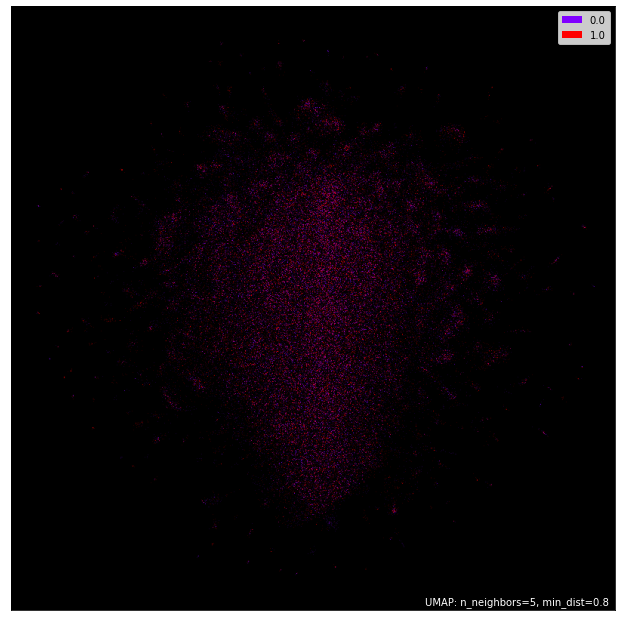

In [58]:

mapper = umap.UMAP(min_dist=0.8, n_neighbors=5, output_metric='euclidean').fit(mmm_vectors)

umap.plot.points(mapper, labels=mmm_labels.to_numpy(), theme='fire')

In [60]:
tickers = list(df['Ticker'].unique())


In [130]:
(tck_vectors[tck_labels == 0].shape,tck_vectors[tck_labels == 1].shape)

((54122, 300), (109497, 300))

In [131]:
uptweets = []
downtweets = []
total_tweets = []
market_cap = []
reg_volume = []
cossims_0 = []
cossims_1 = []
cossims_btw = []
mean_diff_0 = []
mean_diff_1 = []
for ticker in tickers:
    print('processing ',ticker)
    tck_df = df.loc[df['Ticker']==ticker]
    tck_docs = list(tag_titles(tck_df['text']))
    tck_labels = tck_df['slope_labels']
    tck_vectors = np.zeros((len(tck_docs),300),dtype = np.float32)
    for i,doc in enumerate(tck_docs):
        tck_vectors[i,:] = doc_vec_model.infer_vector(doc.words)
    
    cossim_btw = cosine_similarity(tck_vectors[tck_labels == 0],tck_vectors[tck_labels == 1])
    cossim_down = cosine_similarity(tck_vectors[tck_labels == 0],tck_vectors[tck_labels == 0])
    cossim_up = cosine_similarity(tck_vectors[tck_labels == 1],tck_vectors[tck_labels == 1])
    
    uptweets.append(tck_labels[tck_labels == 1].size)
    downtweets.append(tck_labels[tck_labels == 0].size)
    total_tweets.append(tck_labels.size)
    
    ticker_str = ticker
    if '.' in ticker_str:
        ticker_str = ticker_str.replace('.','-')
    
    ytick = yf.Ticker(ticker_str)
    market_cap.append(ytick.info['marketCap'])
    reg_volume.append(ytick.info['regularMarketVolume'])
    cossims_0.append(np.mean(cossim_down))
    cossims_1.append(np.mean(cossim_up))
    cossims_btw.append(np.mean(cossim_btw))
    mean_diff_0.append((np.mean(cossim_down)-np.mean(cossim_btw))/2)
    mean_diff_1.append((np.mean(cossim_up)-np.mean(cossim_btw))/2)
    
sp100_df_copy['inc_tweets'] = uptweets
sp100_df_copy['dec_tweets'] = downtweets
sp100_df_copy['total_tweets'] = total_tweets

sp100_df_copy['market_cap'] = market_cap
sp100_df_copy['reg_volume'] = reg_volume

sp100_df_copy['cos_sim_up'] = cossims_1
sp100_df_copy['cos_sim_down'] = cossims_0
sp100_df_copy['cos_sim_btw'] = cossims_btw

sp100_df_copy['mean_diff_up'] = mean_diff_1
sp100_df_copy['mean_diff_down'] = mean_diff_0

processing  AAPL
processing  ABBV
processing  ABT
processing  ACN
processing  ADBE
processing  AIG
processing  AMGN
processing  AMT
processing  AMZN
processing  AVGO
processing  AXP
processing  BA
processing  BAC
processing  BIIB
processing  BK
processing  BKNG
processing  BLK
processing  BMY
processing  BRK.B
processing  C
processing  CAT
processing  CHTR
processing  CL
processing  CMCSA
processing  COF
processing  COP
processing  COST
processing  CRM
processing  CSCO
processing  CVS
processing  CVX
processing  DD
processing  DHR
processing  DIS
processing  DOW
processing  DUK
processing  EMR
processing  EXC
processing  F
processing  FB
processing  FDX
processing  GD
processing  GE
processing  GILD
processing  GM
processing  GOOG
processing  GOOGL
processing  GS
processing  HD
processing  HON
processing  IBM
processing  INTC
processing  JNJ
processing  JPM
processing  KHC
processing  KO
processing  LIN
processing  LLY
processing  LMT
processing  LOW
processing  MA
processing  MCD
proc

In [ ]:
sp100_df_copy

mapping AAPL
  Symbol   Name                  Sector  inc_tweets  dec_tweets  total_tweets  \
0   AAPL  Apple  Information Technology       37884       42758         80642   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
0  2546027200512    95823036    0.151361      0.168582     0.159589   

   mean_diff_up  mean_diff_down  
0     -0.004114        0.004496  


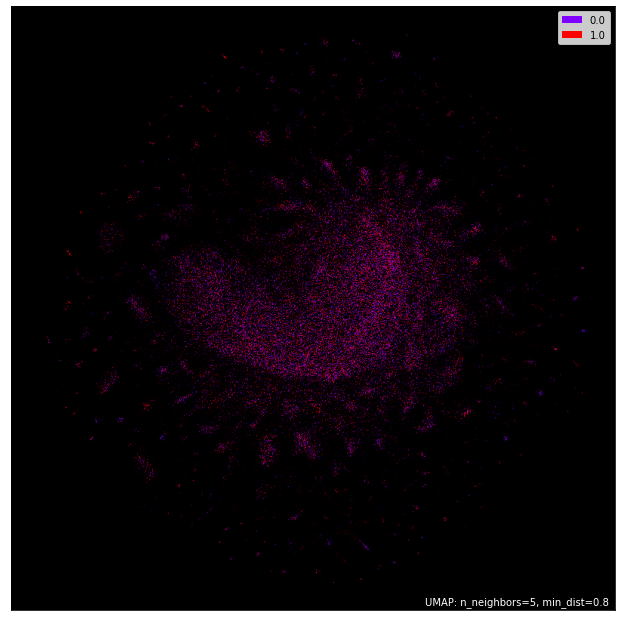

mapping ABBV
  Symbol    Name       Sector  inc_tweets  dec_tweets  total_tweets  \
1   ABBV  AbbVie  Health Care         491         366           857   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
1  201113927680     1586813    0.089901      0.164428     0.111846   

   mean_diff_up  mean_diff_down  
1     -0.010972        0.026291  


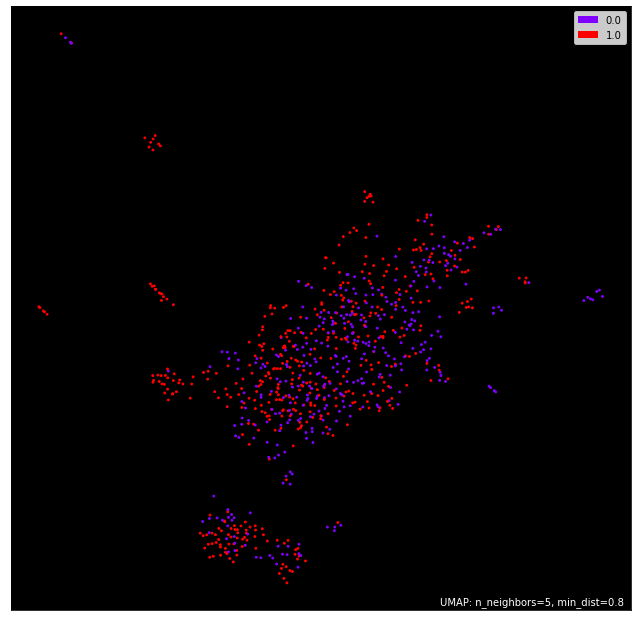

mapping ABT
  Symbol                 Name       Sector  inc_tweets  dec_tweets  \
2    ABT  Abbott Laboratories  Health Care        1770        1003   

   total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
2          2773  227514859520      646178    0.167894      0.163409   

   cos_sim_btw  mean_diff_up  mean_diff_down  
2     0.163675      0.002109       -0.000133  


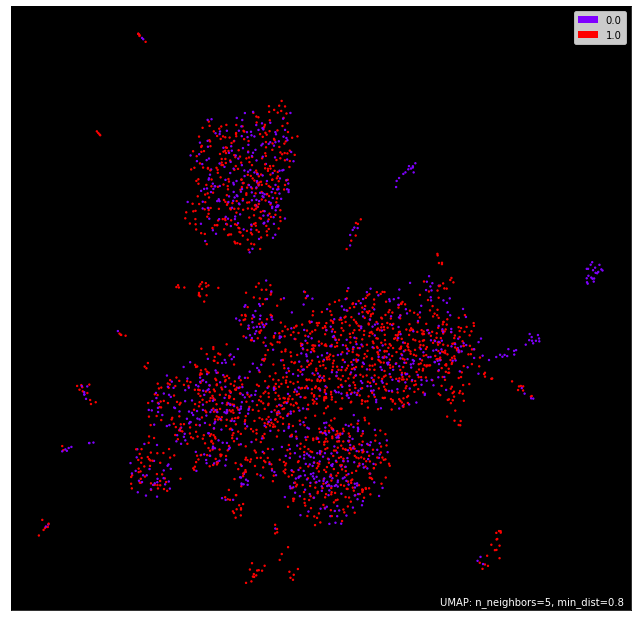

mapping ACN
  Symbol       Name                  Sector  inc_tweets  dec_tweets  \
3    ACN  Accenture  Information Technology         365         237   

   total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
3           602  224428376064      267246    0.186548      0.253805   

   cos_sim_btw  mean_diff_up  mean_diff_down  
3     0.208961     -0.011206        0.022422  


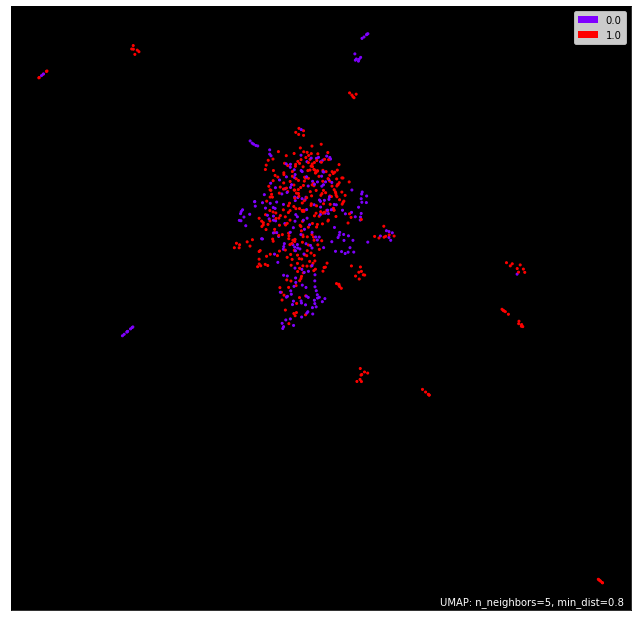

mapping ADBE
  Symbol   Name                  Sector  inc_tweets  dec_tweets  total_tweets  \
4   ADBE  Adobe  Information Technology        1189        1589          2778   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
4  304799842304      375374    0.228449      0.225335     0.225386   

   mean_diff_up  mean_diff_down  
4      0.001532       -0.000026  


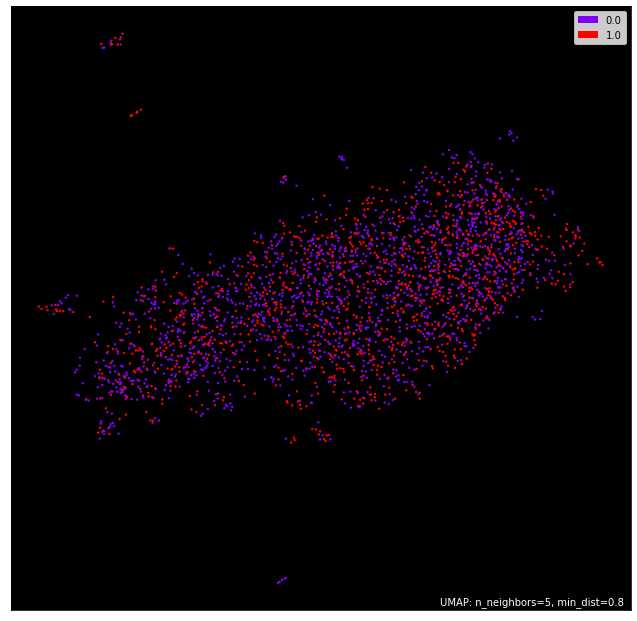

mapping AIG
  Symbol                          Name      Sector  inc_tweets  dec_tweets  \
5    AIG  American International Group  Financials         122          84   

   total_tweets   market_cap  reg_volume  cos_sim_up  cos_sim_down  \
5           206  51525918720      552175    0.306354      0.281443   

   cos_sim_btw  mean_diff_up  mean_diff_down  
5     0.286869      0.009742       -0.002713  


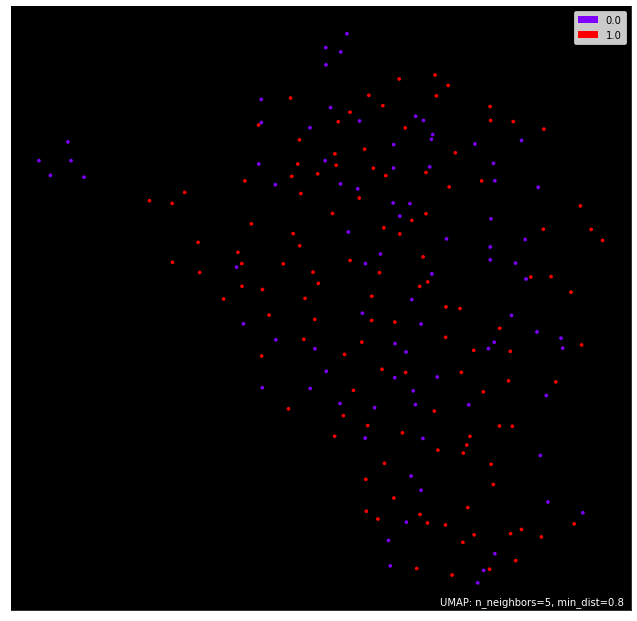

mapping AMGN
  Symbol   Name       Sector  inc_tweets  dec_tweets  total_tweets  \
6   AMGN  Amgen  Health Care         352         523           875   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
6  119269941248      514178    0.144215       0.16084     0.148502   

   mean_diff_up  mean_diff_down  
6     -0.002144        0.006169  


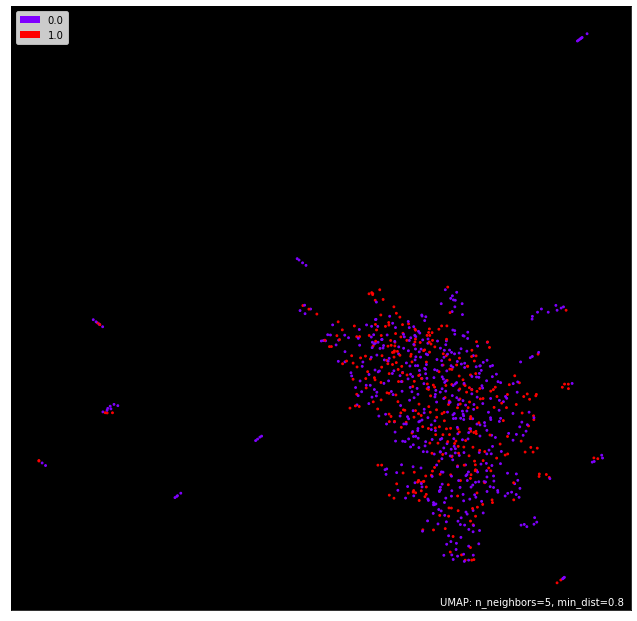

mapping AMT
  Symbol            Name       Sector  inc_tweets  dec_tweets  total_tweets  \
7    AMT  American Tower  Real Estate          70          56           126   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
7  126734016512      276413    0.165704      0.159051     0.121664   

   mean_diff_up  mean_diff_down  
7       0.02202        0.018694  


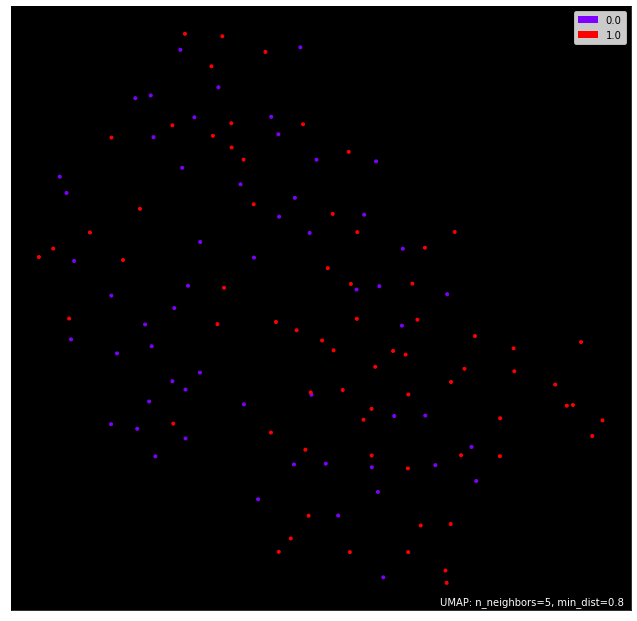

mapping AMZN
  Symbol        Name                  Sector  inc_tweets  dec_tweets  \
8   AMZN  Amazon.com  Consumer Discretionary       23635       28859   

   total_tweets     market_cap  reg_volume  cos_sim_up  cos_sim_down  \
8         52494  1691681554432     1109581    0.136296      0.193494   

   cos_sim_btw  mean_diff_up  mean_diff_down  
8     0.161966     -0.012835        0.015764  


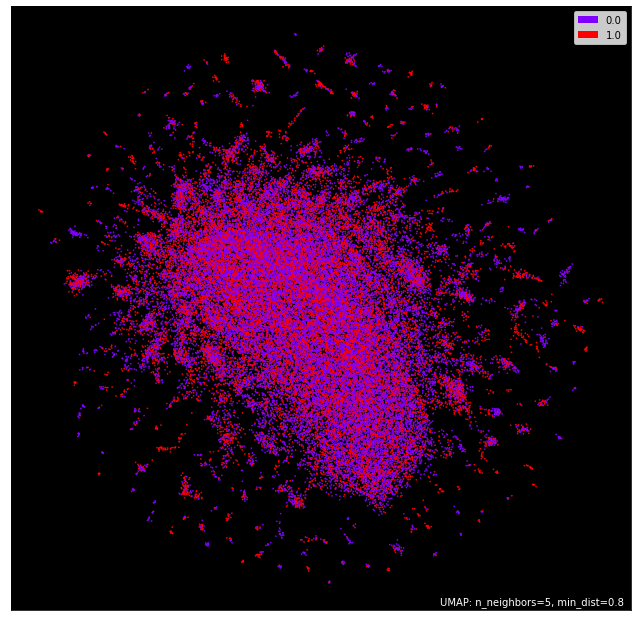

mapping AVGO
  Symbol      Name                  Sector  inc_tweets  dec_tweets  \
9   AVGO  Broadcom  Information Technology        1141         527   

   total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
9          1668  217662537728      196705    0.193243      0.209692   

   cos_sim_btw  mean_diff_up  mean_diff_down  
9     0.196426     -0.001592        0.006633  


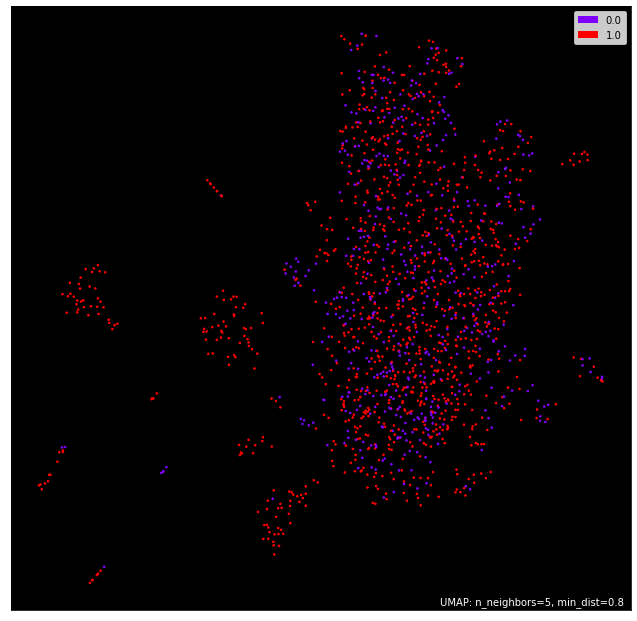

mapping AXP
   Symbol              Name      Sector  inc_tweets  dec_tweets  total_tweets  \
10    AXP  American Express  Financials        2161        1005          3166   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
10  134912163840      483160    0.109235      0.136827     0.117703   

    mean_diff_up  mean_diff_down  
10     -0.004234        0.009562  


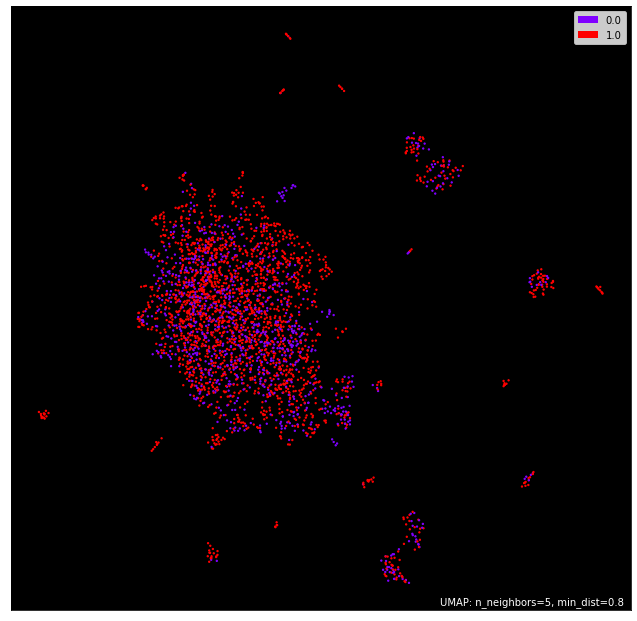

mapping BA
   Symbol    Name       Sector  inc_tweets  dec_tweets  total_tweets  \
11     BA  Boeing  Industrials        8959       11491         20450   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
11  123901468672     2843746    0.229842      0.169784     0.196775   

    mean_diff_up  mean_diff_down  
11      0.016533       -0.013496  


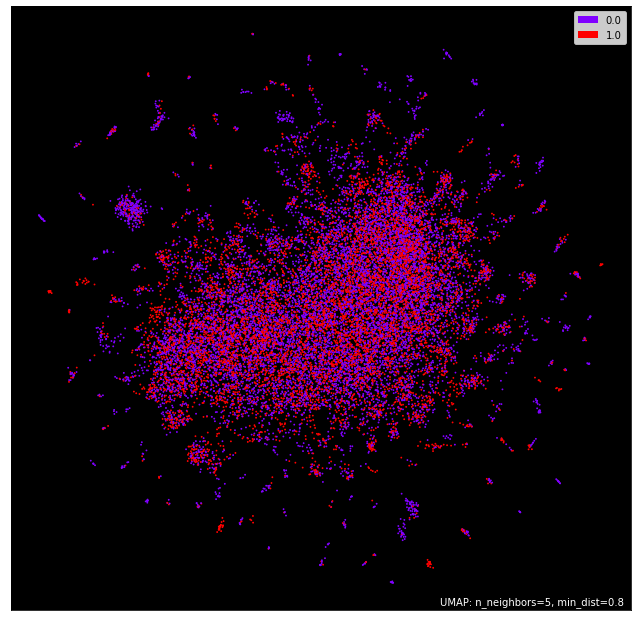

mapping BAC
   Symbol             Name      Sector  inc_tweets  dec_tweets  total_tweets  \
12    BAC  Bank of America  Financials        9353        4232         13585   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
12  392283029504    11644718    0.162762      0.179086     0.170173   

    mean_diff_up  mean_diff_down  
12     -0.003706        0.004457  


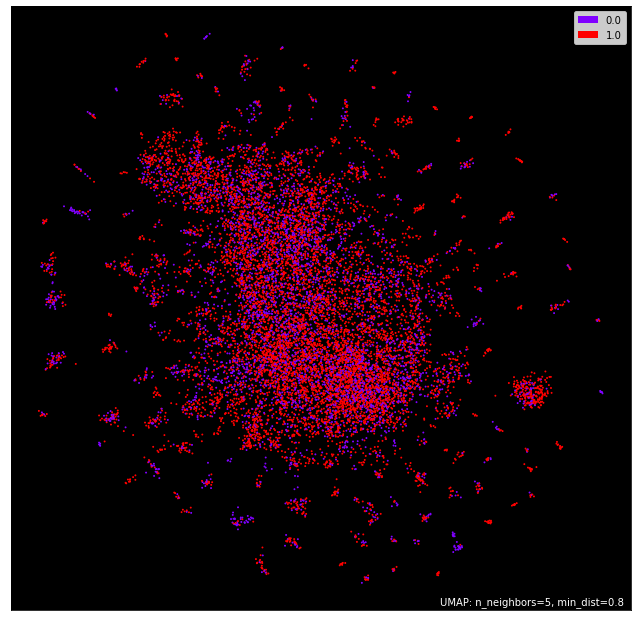

mapping BIIB
   Symbol    Name       Sector  inc_tweets  dec_tweets  total_tweets  \
13   BIIB  Biogen  Health Care        1044        2286          3330   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
13  39809470464      141625    0.194754      0.225506     0.207324   

    mean_diff_up  mean_diff_down  
13     -0.006285        0.009091  


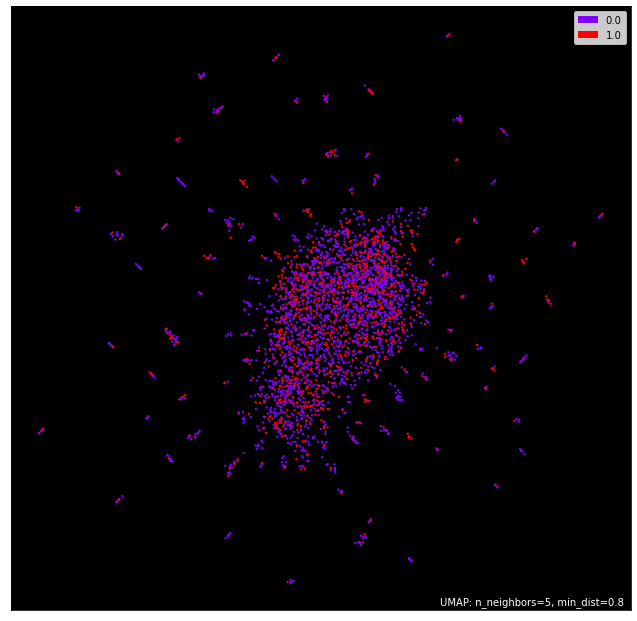

mapping BK
   Symbol        Name      Sector  inc_tweets  dec_tweets  total_tweets  \
14     BK  BNY Mellon  Financials          67          13            80   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
14  49466679296      484236    0.244259      0.412945     0.128594   

    mean_diff_up  mean_diff_down  
14      0.057833        0.142176  


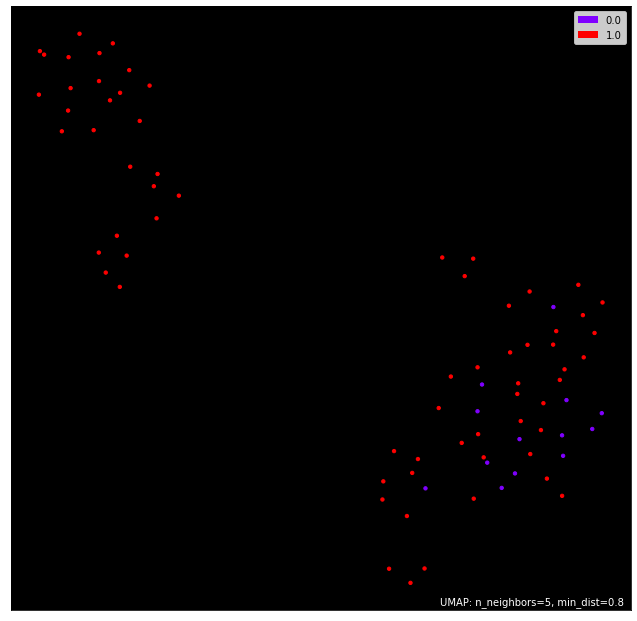

mapping BKNG
   Symbol              Name                  Sector  inc_tweets  dec_tweets  \
15   BKNG  Booking Holdings  Consumer Discretionary          23          24   

    total_tweets   market_cap  reg_volume  cos_sim_up  cos_sim_down  \
15            47  99748864000      149413    0.193746      0.386329   

    cos_sim_btw  mean_diff_up  mean_diff_down  
15     0.233443     -0.019848        0.076443  


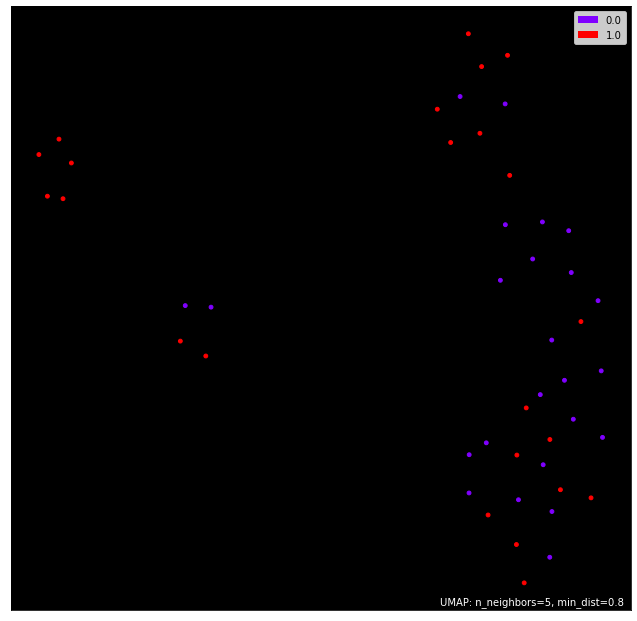

mapping BLK
   Symbol       Name      Sector  inc_tweets  dec_tweets  total_tweets  \
16    BLK  BlackRock  Financials        1405        1602          3007   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
16  142685011968      352210    0.121173      0.180943     0.137353   

    mean_diff_up  mean_diff_down  
16      -0.00809        0.021795  


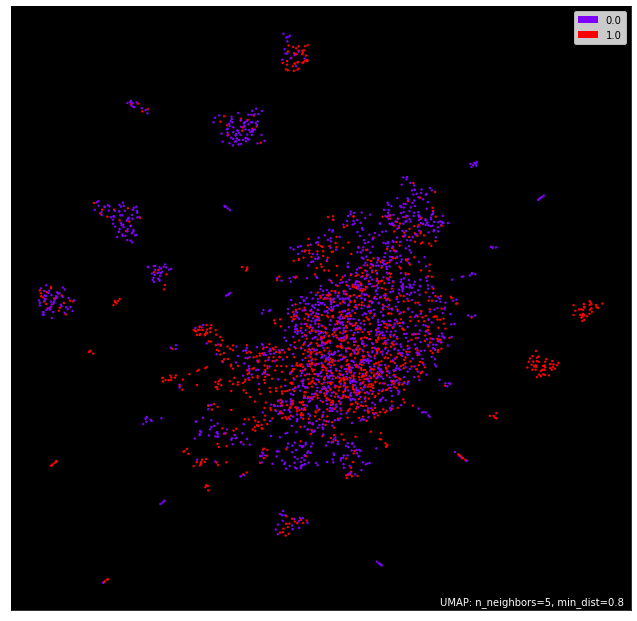

mapping BMY
   Symbol                  Name       Sector  inc_tweets  dec_tweets  \
17    BMY  Bristol Myers Squibb  Health Care         461         461   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
17           922  128891568128    16378055    0.132016      0.172504   

    cos_sim_btw  mean_diff_up  mean_diff_down  
17     0.146163     -0.007074        0.013171  


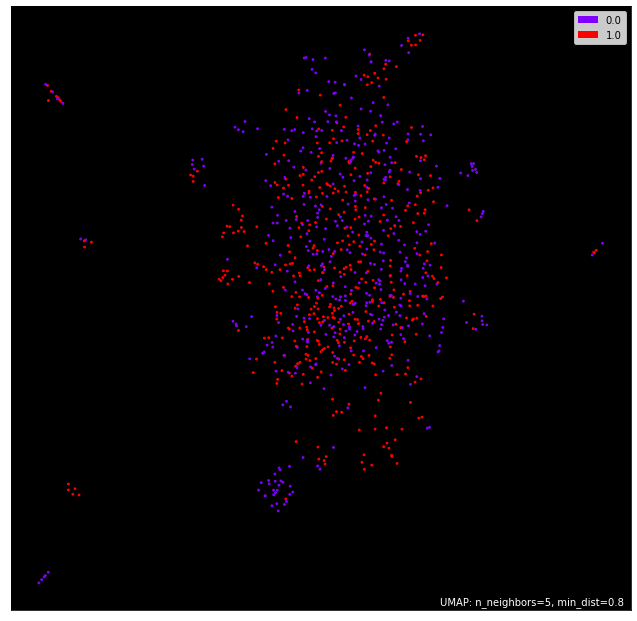

mapping BRK.B
   Symbol                Name      Sector  inc_tweets  dec_tweets  \
18  BRK.B  Berkshire Hathaway  Financials          93          83   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
18           176  662870687744     3278191    0.091619      0.077992   

    cos_sim_btw  mean_diff_up  mean_diff_down  
18     0.076067      0.007776        0.000962  


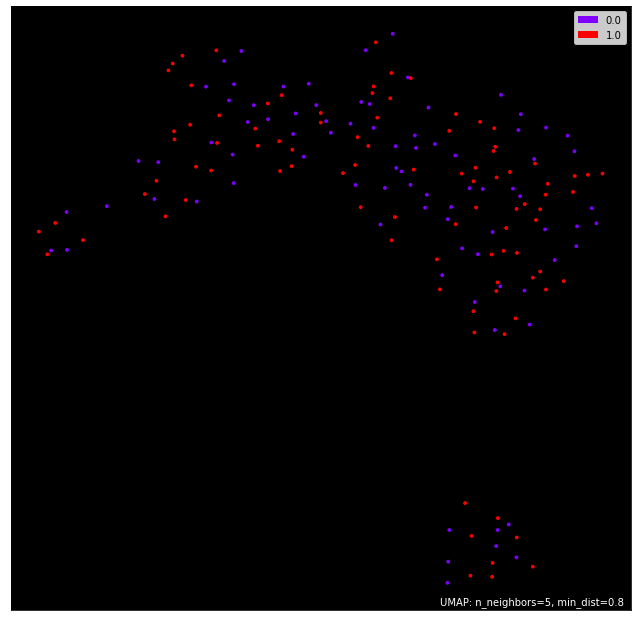

mapping C
   Symbol       Name      Sector  inc_tweets  dec_tweets  total_tweets  \
19      C  Citigroup  Financials        2865        2924          5789   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
19  146512494592    16359782    0.196331      0.179689     0.187101   

    mean_diff_up  mean_diff_down  
19      0.004615       -0.003706  


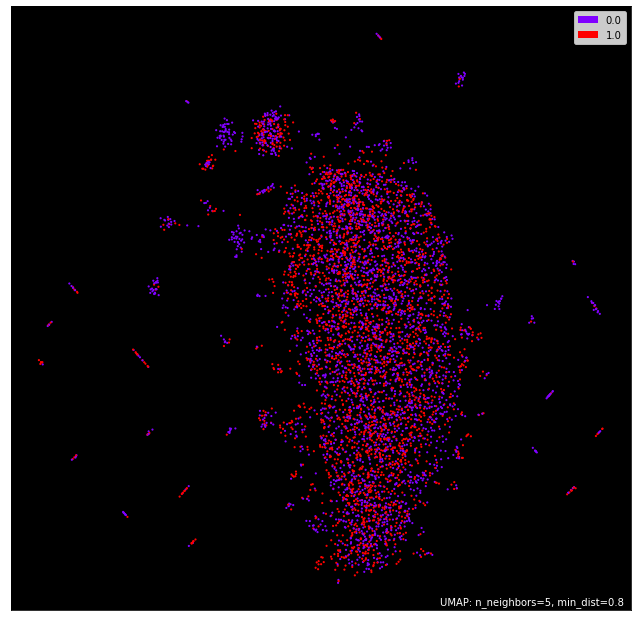

mapping CAT
   Symbol         Name       Sector  inc_tweets  dec_tweets  total_tweets  \
20    CAT  Caterpillar  Industrials        1215        1100          2315   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
20  111797846016     4380256    0.137949      0.170145     0.148818   

    mean_diff_up  mean_diff_down  
20     -0.005435        0.010663  


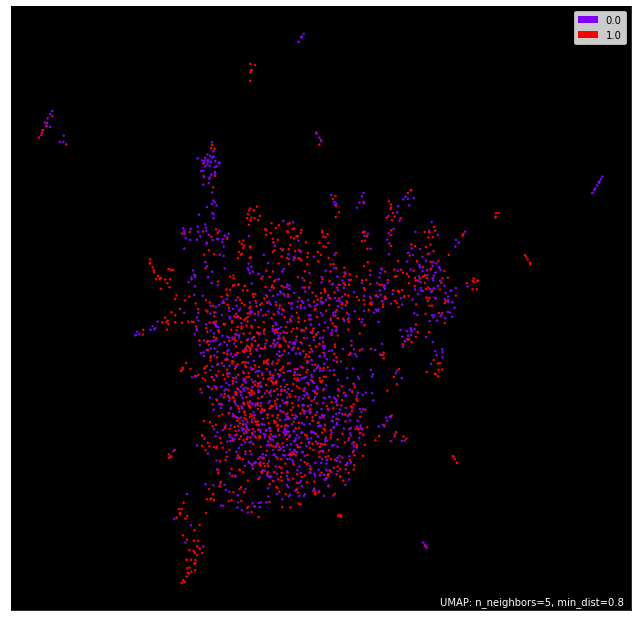

mapping CHTR
   Symbol                    Name                  Sector  inc_tweets  \
21   CHTR  Charter Communications  Communication Services         724   

    dec_tweets  total_tweets    market_cap  reg_volume  cos_sim_up  \
21        1069          1793  133249138688     1179724    0.421093   

    cos_sim_down  cos_sim_btw  mean_diff_up  mean_diff_down  
21      0.379222     0.397091      0.012001       -0.008934  


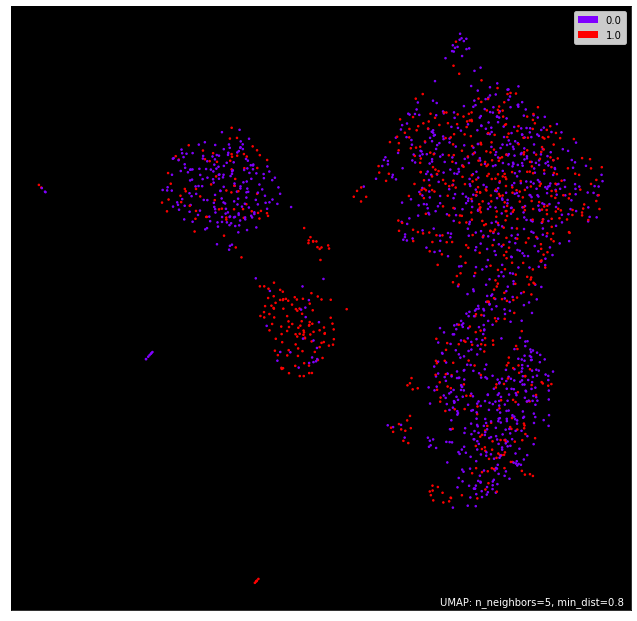

mapping CL
   Symbol               Name            Sector  inc_tweets  dec_tweets  \
22     CL  Colgate-Palmolive  Consumer Staples         470         726   

    total_tweets   market_cap  reg_volume  cos_sim_up  cos_sim_down  \
22          1196  65038094336     4738670    0.112664      0.113833   

    cos_sim_btw  mean_diff_up  mean_diff_down  
22     0.111631      0.000517        0.001101  


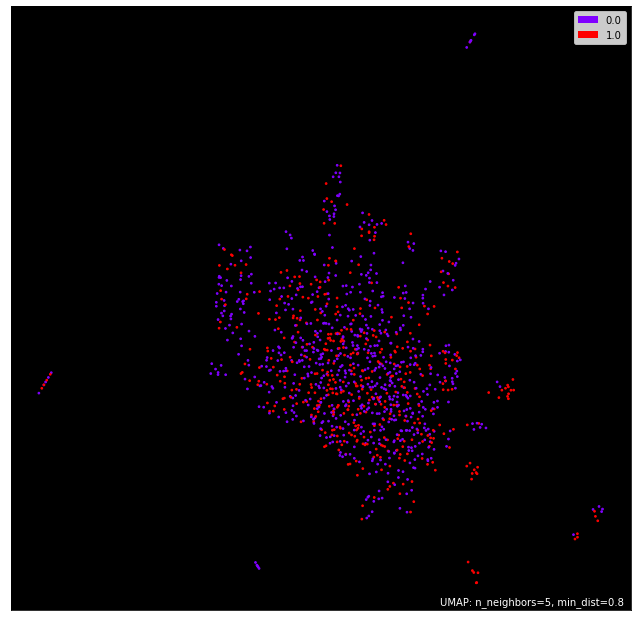

mapping CMCSA
   Symbol     Name                  Sector  inc_tweets  dec_tweets  \
23  CMCSA  Comcast  Communication Services         969        1291   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
23          2260  240456482816     5073112    0.173891      0.183198   

    cos_sim_btw  mean_diff_up  mean_diff_down  
23     0.177616     -0.001862        0.002791  


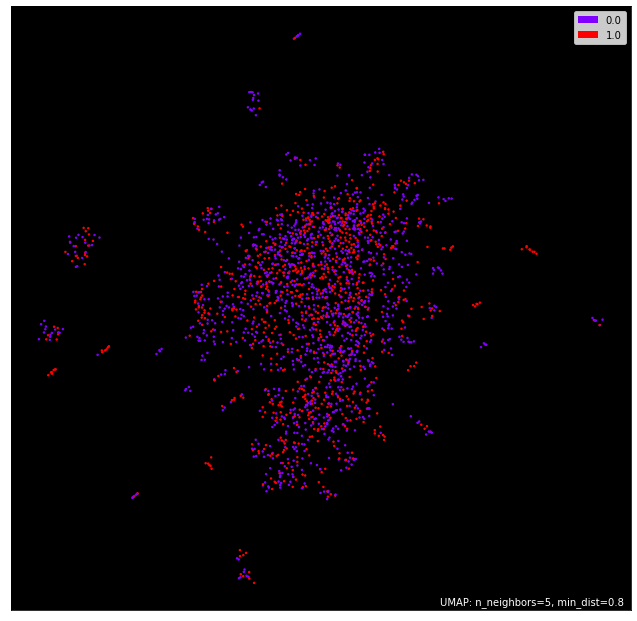

mapping COF
   Symbol         Name      Sector  inc_tweets  dec_tweets  total_tweets  \
24    COF  Capital One  Financials         134         266           400   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
24  68856586240     4347004    0.237467      0.194445     0.206893   

    mean_diff_up  mean_diff_down  
24      0.015287       -0.006224  


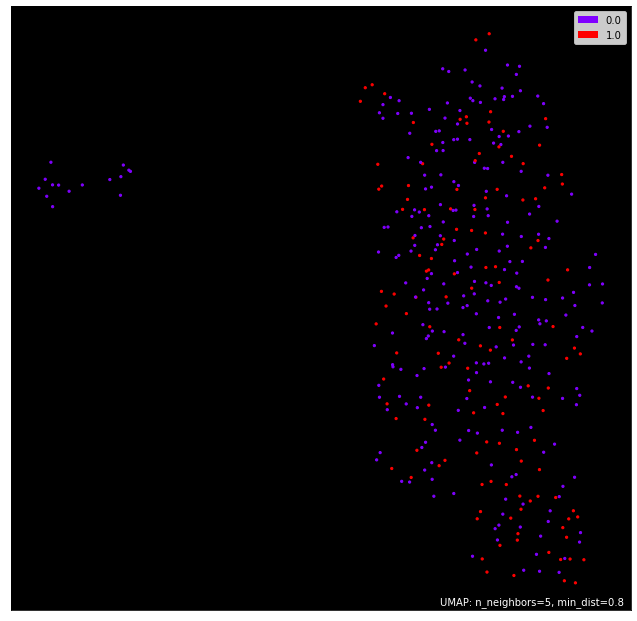

mapping COP
   Symbol            Name  Sector  inc_tweets  dec_tweets  total_tweets  \
25    COP  ConocoPhillips  Energy        1583         510          2093   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
25  101408915456     5086591    0.134259      0.179496     0.153384   

    mean_diff_up  mean_diff_down  
25     -0.009562        0.013056  


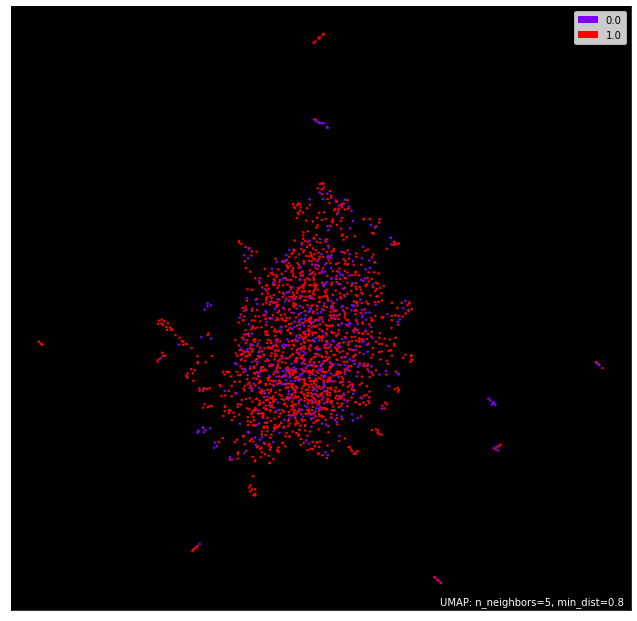

mapping COST
   Symbol    Name            Sector  inc_tweets  dec_tweets  total_tweets  \
26   COST  Costco  Consumer Staples        3644        2167          5811   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
26  217076203520     1362377    0.198611      0.226845     0.209373   

    mean_diff_up  mean_diff_down  
26     -0.005381        0.008736  


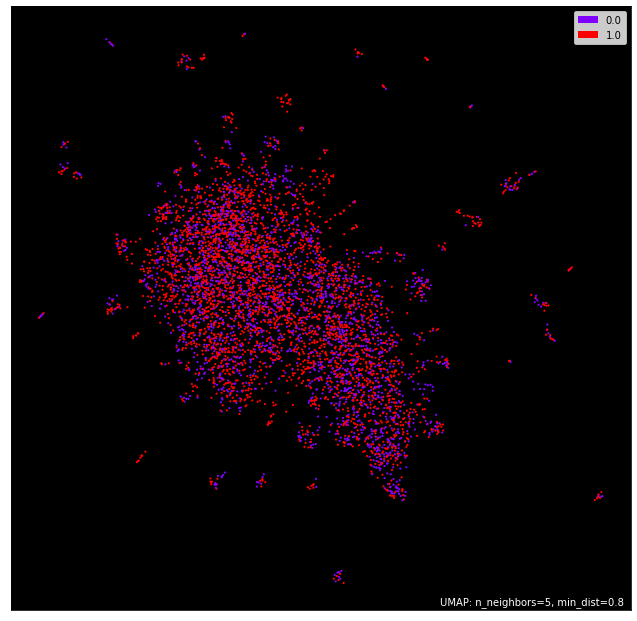

mapping CRM
   Symbol        Name                  Sector  inc_tweets  dec_tweets  \
27    CRM  Salesforce  Information Technology        6648        2764   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
27          9412  275175899136     3450407    0.195813      0.216898   

    cos_sim_btw  mean_diff_up  mean_diff_down  
27     0.204917     -0.004552         0.00599  


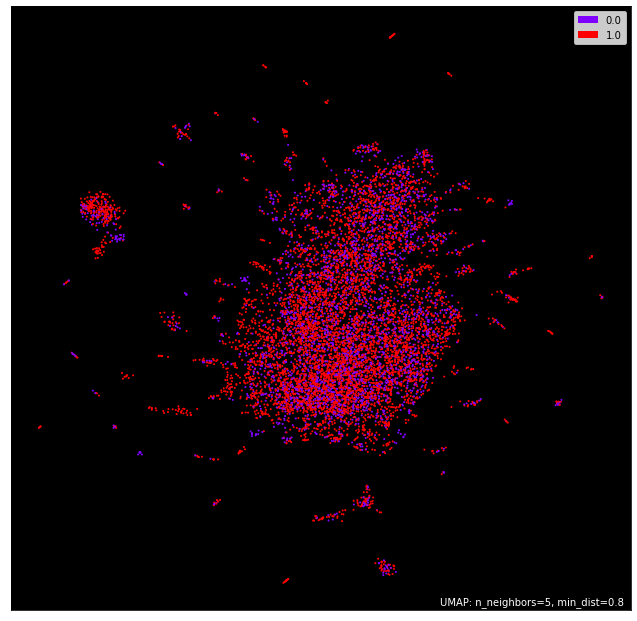

mapping CSCO
   Symbol           Name                  Sector  inc_tweets  dec_tweets  \
28   CSCO  Cisco Systems  Information Technology        1411        1750   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
28          3161  237006618624    11209173    0.205433      0.259676   

    cos_sim_btw  mean_diff_up  mean_diff_down  
28     0.227237     -0.010902        0.016219  


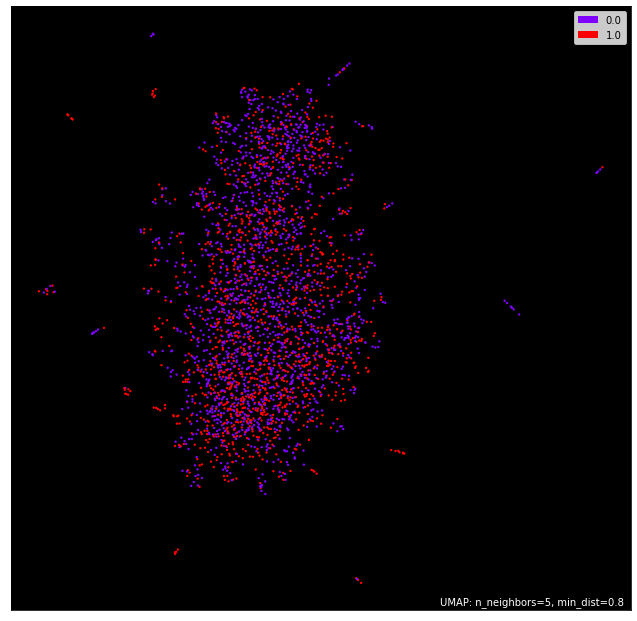

mapping CVS
   Symbol        Name       Sector  inc_tweets  dec_tweets  total_tweets  \
29    CVS  CVS Health  Health Care         987         672          1659   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
29  116674437120     4371284    0.155818      0.189565      0.16856   

    mean_diff_up  mean_diff_down  
29     -0.006371        0.010502  


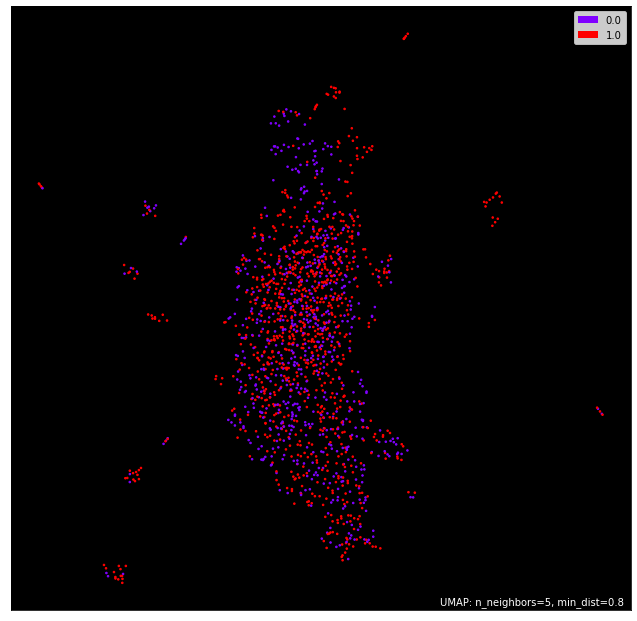

mapping CVX
   Symbol     Name  Sector  inc_tweets  dec_tweets  total_tweets  \
30    CVX  Chevron  Energy        6537        3118          9655   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
30  218102153216     7412731    0.173274      0.202543     0.186256   

    mean_diff_up  mean_diff_down  
30     -0.006491        0.008144  


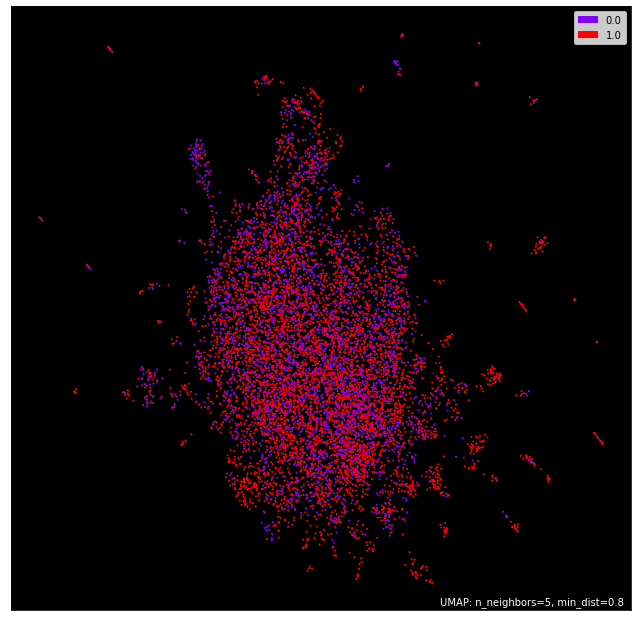

mapping DD
   Symbol    Name     Sector  inc_tweets  dec_tweets  total_tweets  \
31     DD  DuPont  Materials           8          14            22   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
31  37122228224     1936486    0.372275      0.379281     0.320345   

    mean_diff_up  mean_diff_down  
31      0.025965        0.029468  


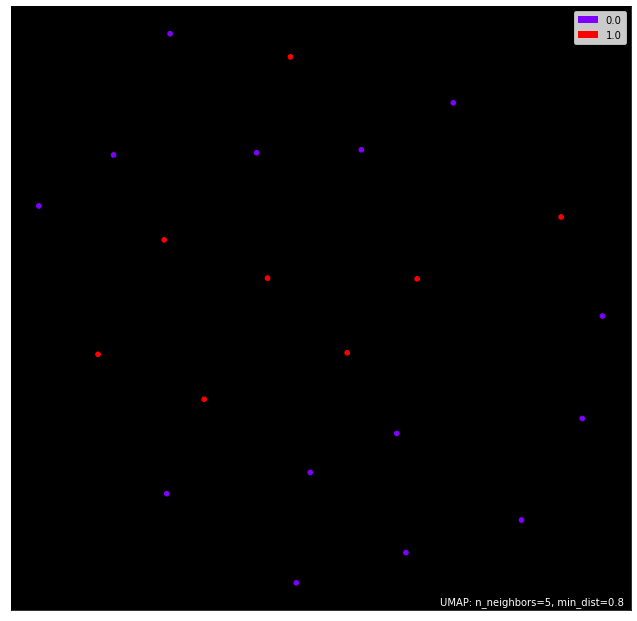

mapping DHR
   Symbol     Name       Sector  inc_tweets  dec_tweets  total_tweets  \
32    DHR  Danaher  Health Care          84          48           132   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
32  217243385856     2403869    0.154942      0.214602     0.115291   

    mean_diff_up  mean_diff_down  
32      0.019826        0.049655  


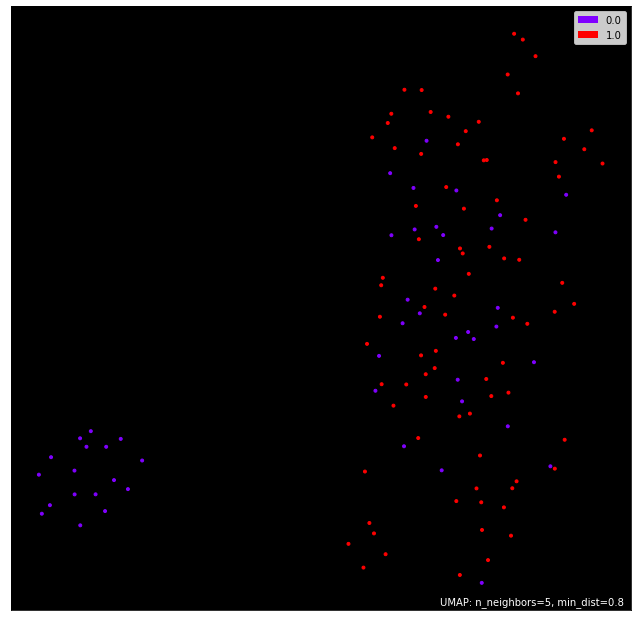

mapping DIS
   Symbol    Name                  Sector  inc_tweets  dec_tweets  \
33    DIS  Disney  Communication Services        5963       10727   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
33         16690  308296679424     7863658    0.163899      0.188722   

    cos_sim_btw  mean_diff_up  mean_diff_down  
33     0.175425     -0.005763        0.006649  


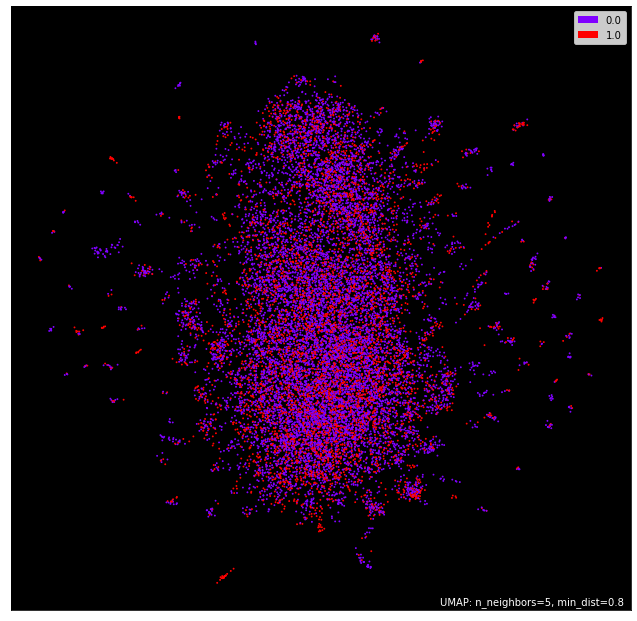

mapping DOW
   Symbol Name     Sector  inc_tweets  dec_tweets  total_tweets   market_cap  \
34    DOW  Dow  Materials         438         475           913  42257166336   

    reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  mean_diff_up  \
34     5974358    0.177414      0.185039     0.176004      0.000705   

    mean_diff_down  
34        0.004518  


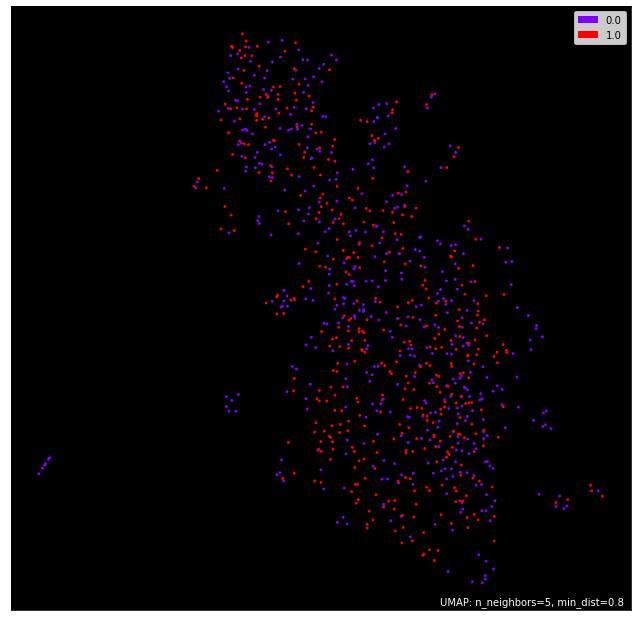

mapping DUK
   Symbol         Name     Sector  inc_tweets  dec_tweets  total_tweets  \
35    DUK  Duke Energy  Utilities          12           2            14   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
35  78837047296     1972470    0.164259      0.959147     0.049683   

    mean_diff_up  mean_diff_down  
35      0.057288        0.454732  


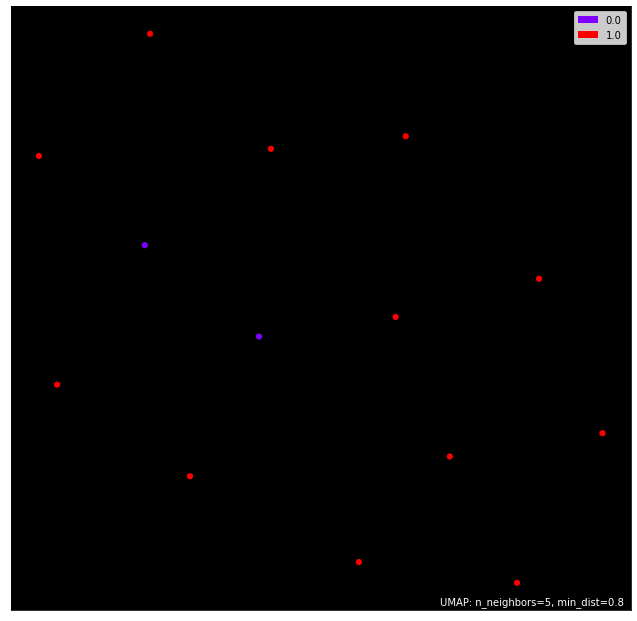

mapping EMR
   Symbol              Name       Sector  inc_tweets  dec_tweets  \
36    EMR  Emerson Electric  Industrials           6          15   

    total_tweets   market_cap  reg_volume  cos_sim_up  cos_sim_down  \
36            21  58476744704     1559225    0.364711      0.352487   

    cos_sim_btw  mean_diff_up  mean_diff_down  
36     0.272672      0.046019        0.039907  


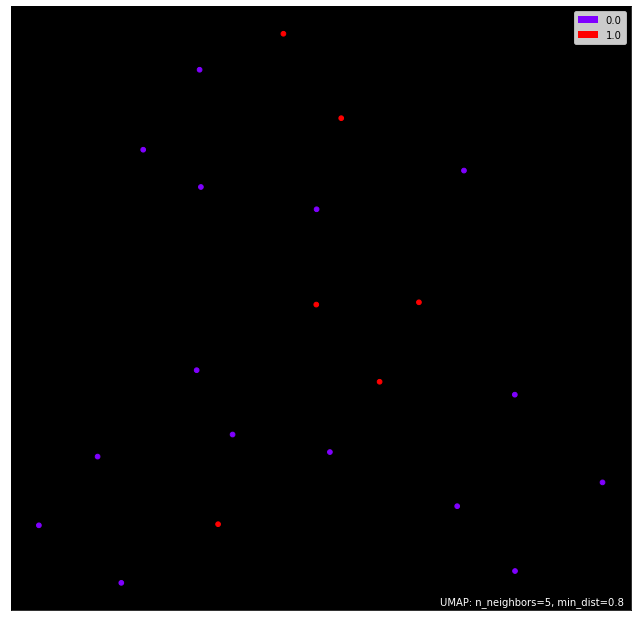

mapping EXC
   Symbol    Name     Sector  inc_tweets  dec_tweets  total_tweets  \
37    EXC  Exelon  Utilities           8           4            12   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
37  51545980928     5216383    0.321361      0.353444     0.201381   

    mean_diff_up  mean_diff_down  
37       0.05999        0.076032  


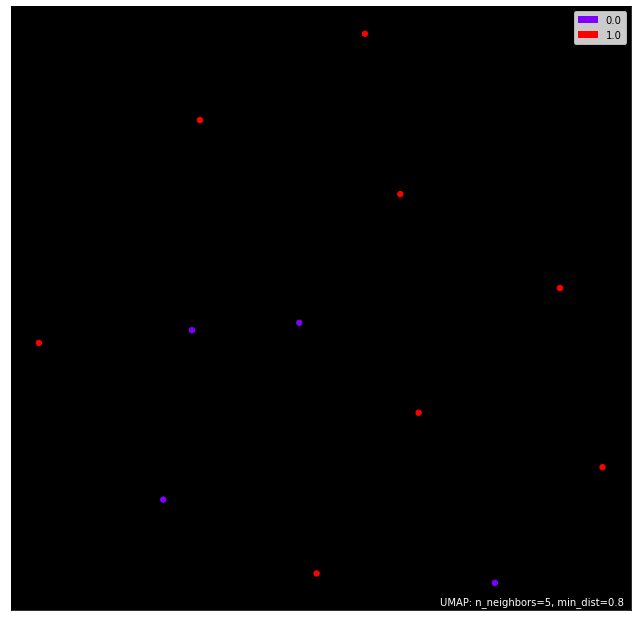

mapping F
   Symbol  Name                  Sector  inc_tweets  dec_tweets  total_tweets  \
38      F  Ford  Consumer Discretionary       11489       11766         23255   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
38  67299053568   214469161    0.149455      0.107044     0.125796   

    mean_diff_up  mean_diff_down  
38       0.01183       -0.009376  


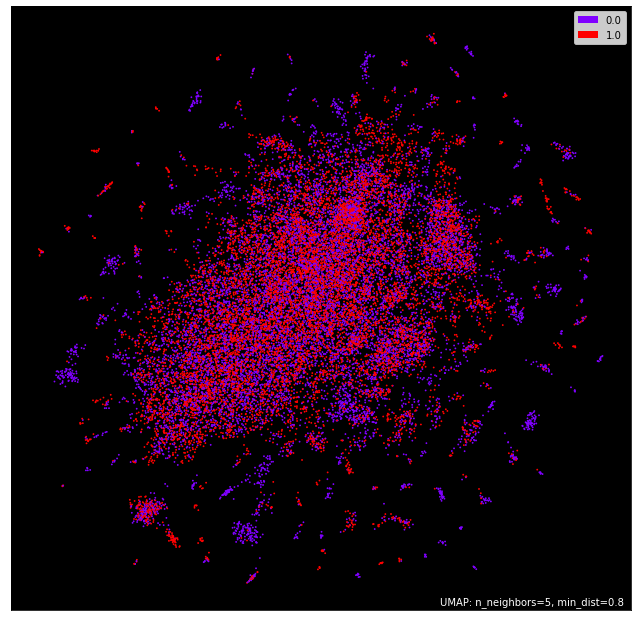

mapping FB
   Symbol      Name                  Sector  inc_tweets  dec_tweets  \
39     FB  Facebook  Communication Services       29384       33661   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
39         63045  898614034432    50806840    0.112173      0.113651   

    cos_sim_btw  mean_diff_up  mean_diff_down  
39     0.112774       -0.0003        0.000439  


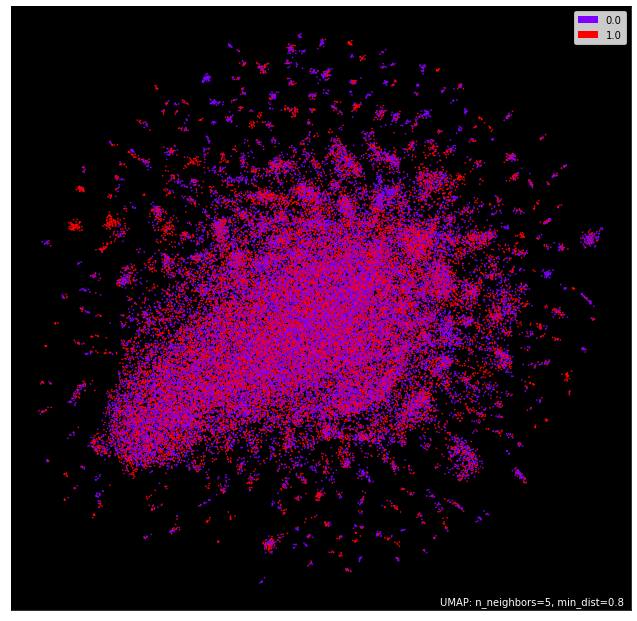

mapping FDX
   Symbol   Name       Sector  inc_tweets  dec_tweets  total_tweets  \
40    FDX  FedEx  Industrials        1566        2068          3634   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
40  62610100224     1718677    0.212716      0.288237     0.237551   

    mean_diff_up  mean_diff_down  
40     -0.012417        0.025343  


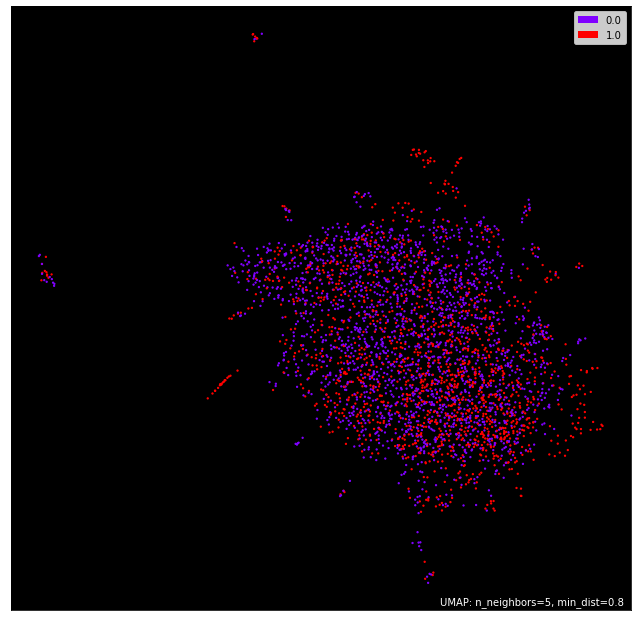

mapping GD
   Symbol              Name       Sector  inc_tweets  dec_tweets  \
41     GD  General Dynamics  Industrials         121          40   

    total_tweets   market_cap  reg_volume  cos_sim_up  cos_sim_down  \
41           161  58000150528     1119683    0.210195      0.241232   

    cos_sim_btw  mean_diff_up  mean_diff_down  
41     0.193671      0.008262        0.023781  


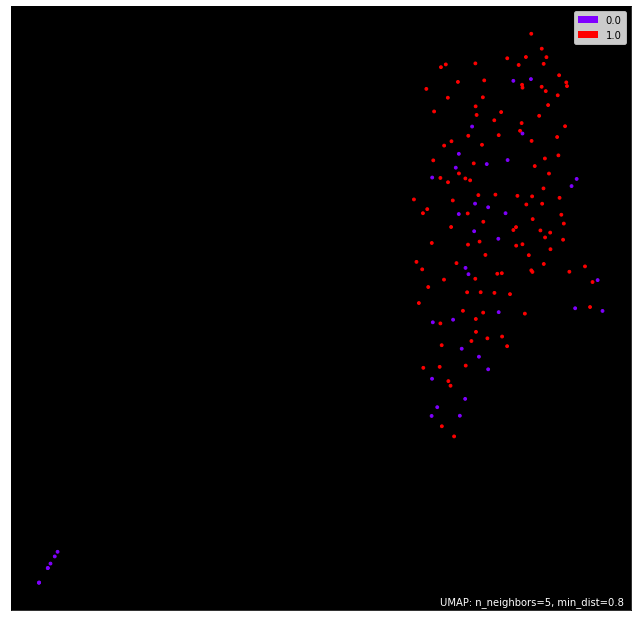

mapping GE
   Symbol              Name       Sector  inc_tweets  dec_tweets  \
42     GE  General Electric  Industrials        3012        1613   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
42          4625  924039708672     5895808    0.146535      0.173058   

    cos_sim_btw  mean_diff_up  mean_diff_down  
42     0.155229     -0.004347        0.008915  


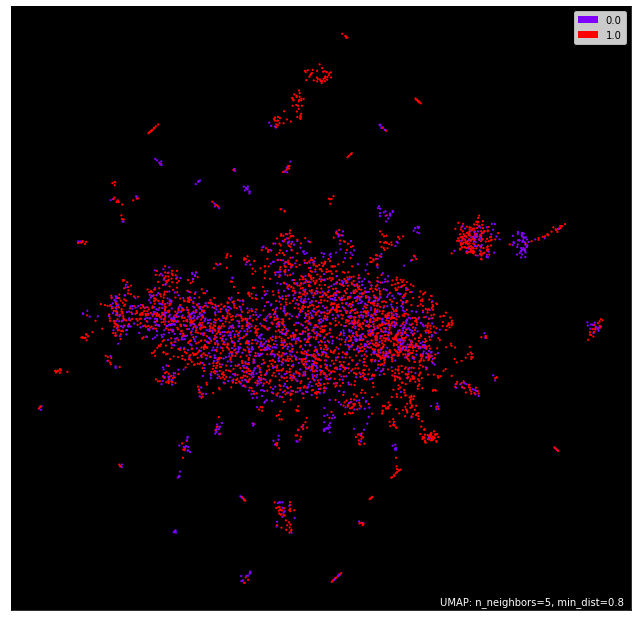

mapping GILD
   Symbol             Name       Sector  inc_tweets  dec_tweets  total_tweets  \
43   GILD  Gilead Sciences  Health Care         591         976          1567   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
43  84456472576     5884835    0.180179      0.188198     0.182103   

    mean_diff_up  mean_diff_down  
43     -0.000962        0.003048  


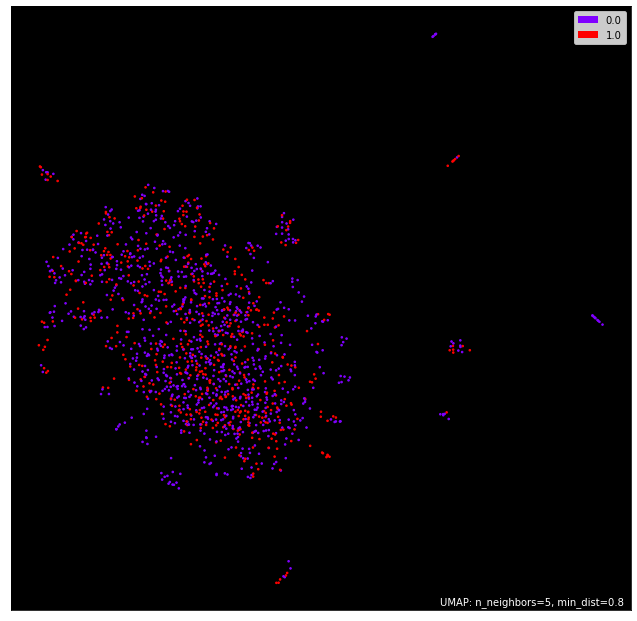

mapping GM
   Symbol            Name                  Sector  inc_tweets  dec_tweets  \
44     GM  General Motors  Consumer Discretionary        5843        5969   

    total_tweets   market_cap  reg_volume  cos_sim_up  cos_sim_down  \
44         11812  78684340224    22067745    0.233953      0.200791   

    cos_sim_btw  mean_diff_up  mean_diff_down  
44     0.214782      0.009586       -0.006995  


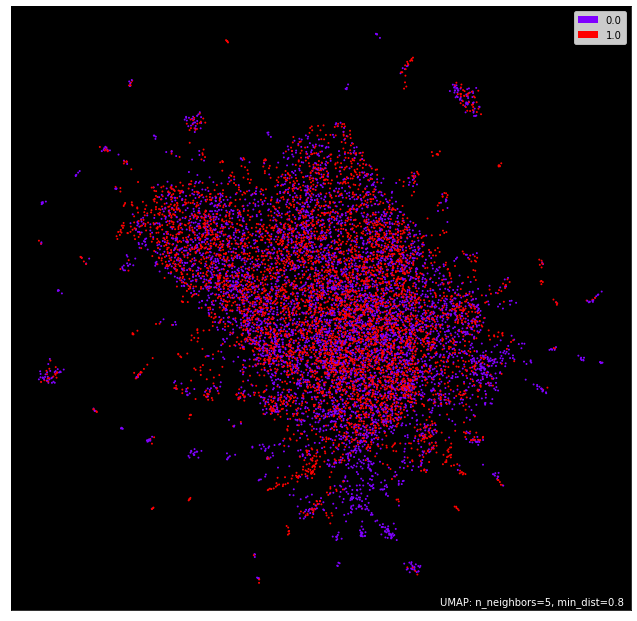

mapping GOOG
   Symbol                Name                  Sector  inc_tweets  dec_tweets  \
45   GOOG  Alphabet (Class C)  Communication Services        7922        6188   

    total_tweets     market_cap  reg_volume  cos_sim_up  cos_sim_down  \
45         14110  1921368457216     1620903    0.160627      0.191792   

    cos_sim_btw  mean_diff_up  mean_diff_down  
45     0.173443     -0.006408        0.009175  


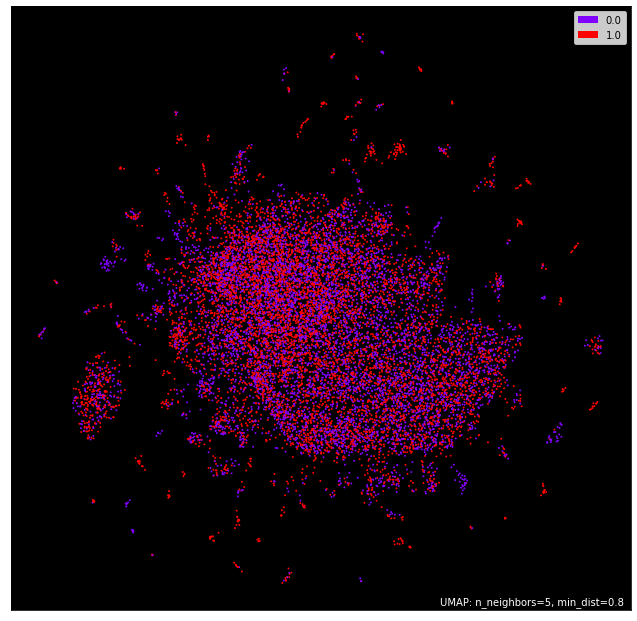

mapping GOOGL
   Symbol                Name                  Sector  inc_tweets  dec_tweets  \
46  GOOGL  Alphabet (Class A)  Communication Services       12048        7223   

    total_tweets     market_cap  reg_volume  cos_sim_up  cos_sim_down  \
46         19271  1974255747072     1810319    0.128304      0.161004   

    cos_sim_btw  mean_diff_up  mean_diff_down  
46     0.141666     -0.006681        0.009669  


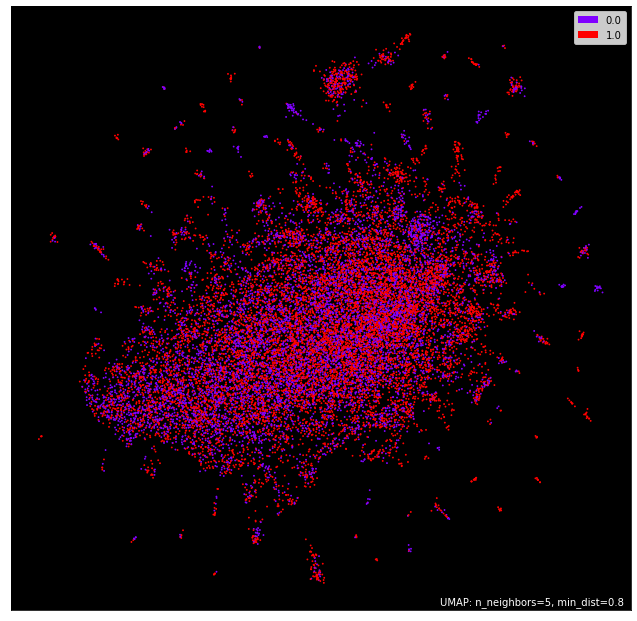

mapping GS
   Symbol           Name      Sector  inc_tweets  dec_tweets  total_tweets  \
47     GS  Goldman Sachs  Financials        5346        4222          9568   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
47  140940066816     1442694    0.113692      0.149209     0.126549   

    mean_diff_up  mean_diff_down  
47     -0.006429         0.01133  


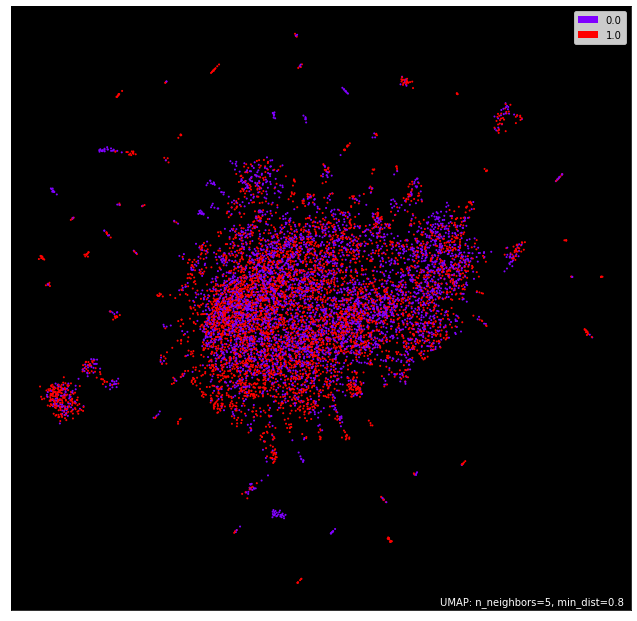

mapping HD
   Symbol        Name                  Sector  inc_tweets  dec_tweets  \
48     HD  Home Depot  Consumer Discretionary        3974        1428   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
48          5402  395075551232     2553451    0.164828       0.22812   

    cos_sim_btw  mean_diff_up  mean_diff_down  
48     0.188499     -0.011836         0.01981  


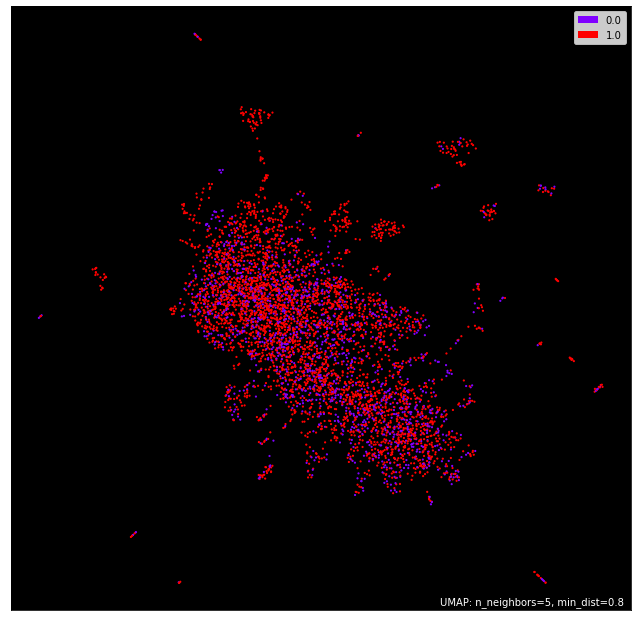

mapping HON
   Symbol       Name       Sector  inc_tweets  dec_tweets  total_tweets  \
49    HON  Honeywell  Industrials         123          69           192   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
49  151746592768     1907425    0.108392       0.18328     0.099874   

    mean_diff_up  mean_diff_down  
49      0.004259        0.041703  


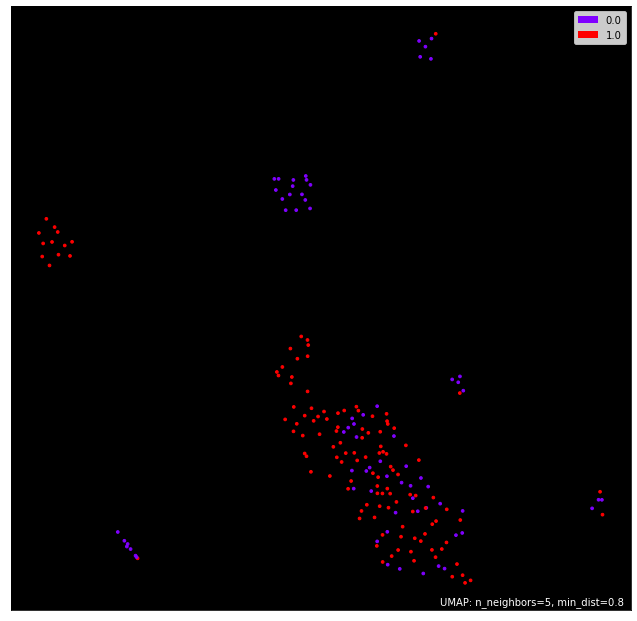

mapping IBM
   Symbol Name                  Sector  inc_tweets  dec_tweets  total_tweets  \
50    IBM  IBM  Information Technology         695        1536          2231   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
50  112440934400     6375259    0.256995      0.181672     0.213387   

    mean_diff_up  mean_diff_down  
50      0.021804       -0.015858  


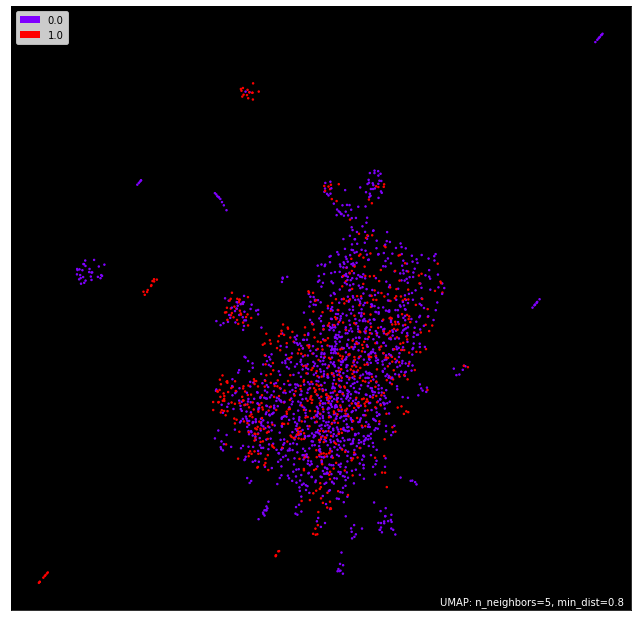

mapping INTC
   Symbol   Name                  Sector  inc_tweets  dec_tweets  \
51   INTC  Intel  Information Technology        5196        4723   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
51          9919  194147057664    31317178    0.142098      0.143676   

    cos_sim_btw  mean_diff_up  mean_diff_down  
51      0.13989      0.001104        0.001893  


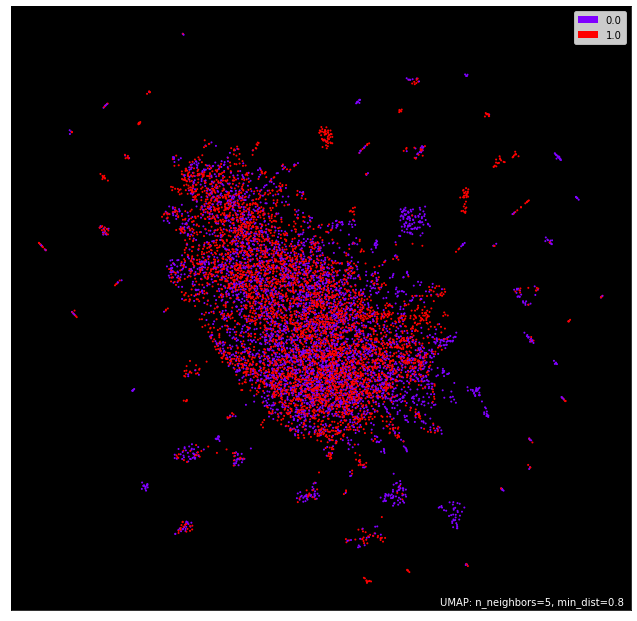

mapping JNJ
   Symbol               Name       Sector  inc_tweets  dec_tweets  \
52    JNJ  Johnson & Johnson  Health Care        3190        2964   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
52          6154  428849201152     6278844    0.113305      0.192667   

    cos_sim_btw  mean_diff_up  mean_diff_down  
52     0.135499     -0.011097        0.028584  


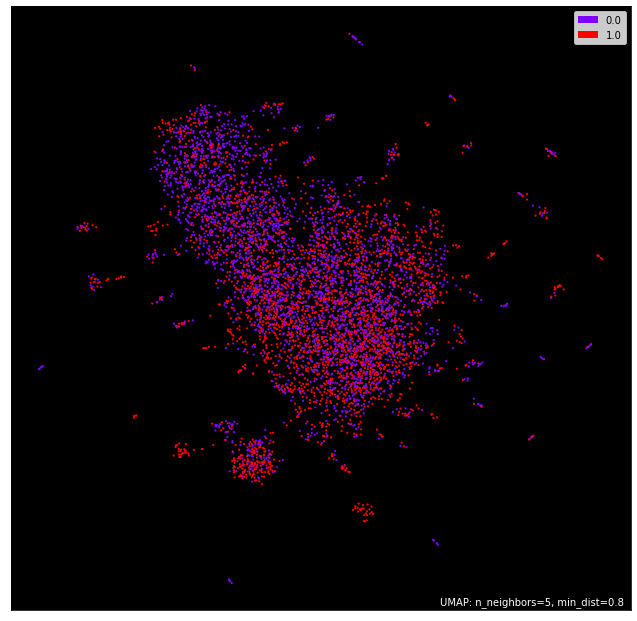

mapping JPM
   Symbol            Name      Sector  inc_tweets  dec_tweets  total_tweets  \
53    JPM  JPMorgan Chase  Financials        4458        4854          9312   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
53  515696754688     7055833    0.157092      0.127799     0.134858   

    mean_diff_up  mean_diff_down  
53      0.011117       -0.003529  


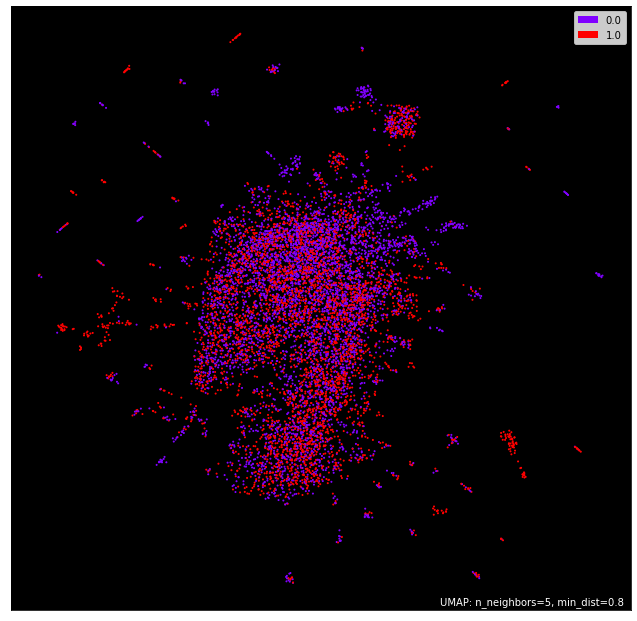

mapping KHC
   Symbol         Name            Sector  inc_tweets  dec_tweets  \
54    KHC  Kraft Heinz  Consumer Staples         123          84   

    total_tweets   market_cap  reg_volume  cos_sim_up  cos_sim_down  \
54           207  44620509184     5816148     0.17125      0.127244   

    cos_sim_btw  mean_diff_up  mean_diff_down  
54     0.133577      0.018837       -0.003166  


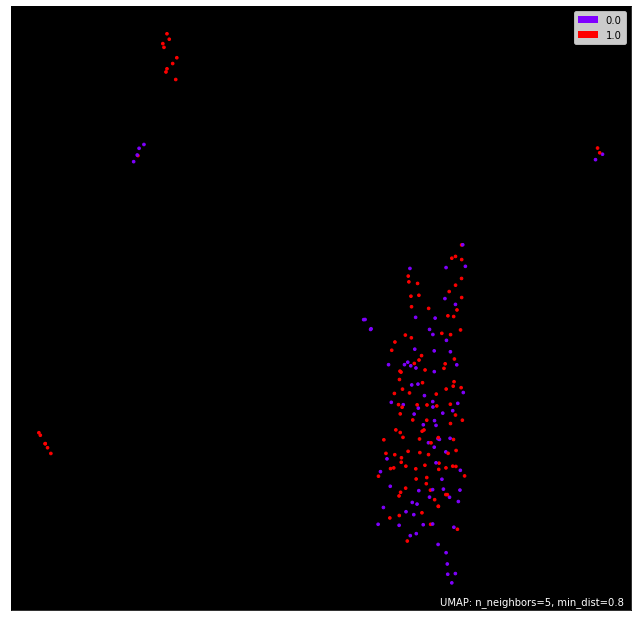

mapping KO
   Symbol       Name            Sector  inc_tweets  dec_tweets  total_tweets  \
55     KO  Coca-Cola  Consumer Staples        1977        1111          3088   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
55  241626546176    15890643    0.101649       0.12173     0.107061   

    mean_diff_up  mean_diff_down  
55     -0.002706        0.007334  


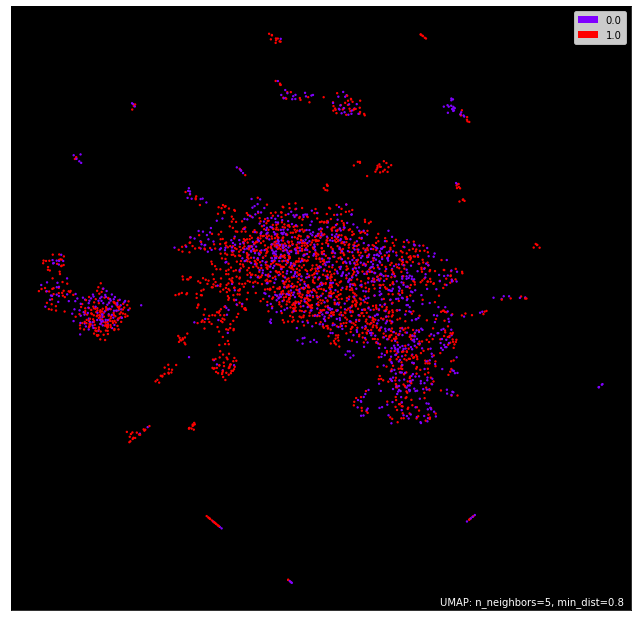

mapping LIN
   Symbol   Name       Sector  inc_tweets  dec_tweets  total_tweets  \
56    LIN  Linde  Industrials          78          76           154   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
56  165348737024     1550993    0.309847        0.2112     0.242255   

    mean_diff_up  mean_diff_down  
56      0.033796       -0.015527  


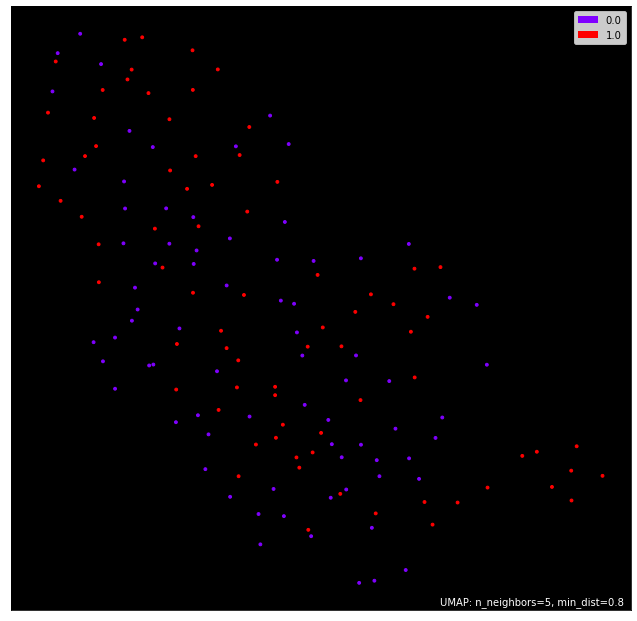

mapping LLY
   Symbol       Name       Sector  inc_tweets  dec_tweets  total_tweets  \
57    LLY  Eli Lilly  Health Care         927         689          1616   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
57  242969001984     3306888    0.111723      0.167562     0.126143   

    mean_diff_up  mean_diff_down  
57      -0.00721         0.02071  


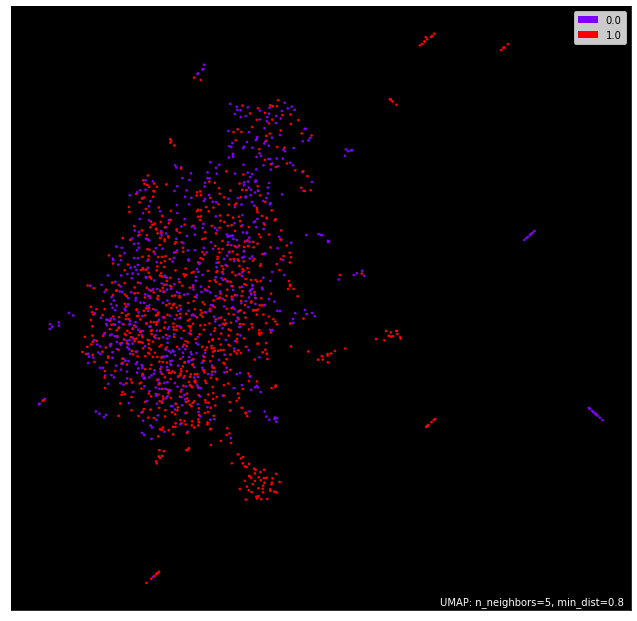

mapping LMT
   Symbol             Name       Sector  inc_tweets  dec_tweets  total_tweets  \
58    LMT  Lockheed Martin  Industrials        1156        1198          2354   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
58  92104556544     2857245    0.138841      0.181981     0.154002   

    mean_diff_up  mean_diff_down  
58      -0.00758         0.01399  


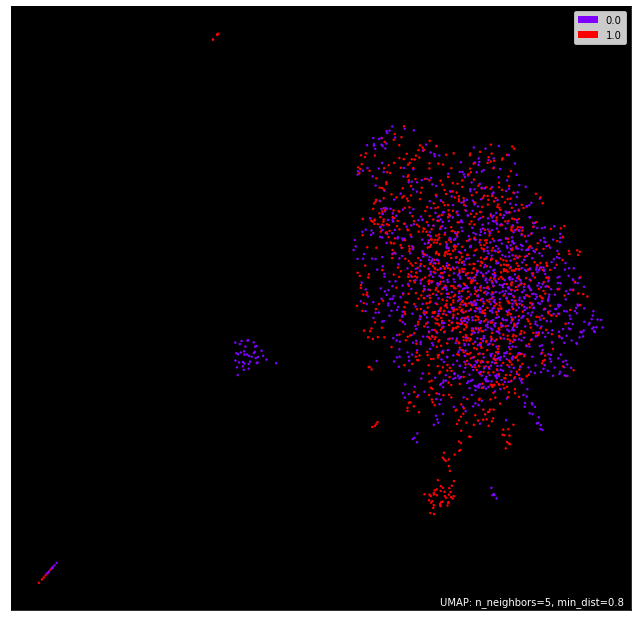

mapping LOW
   Symbol    Name                  Sector  inc_tweets  dec_tweets  \
59    LOW  Lowe's  Consumer Discretionary         995         446   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
59          1441  163828826112     2405536    0.188745      0.198484   

    cos_sim_btw  mean_diff_up  mean_diff_down  
59     0.191816     -0.001536        0.003334  


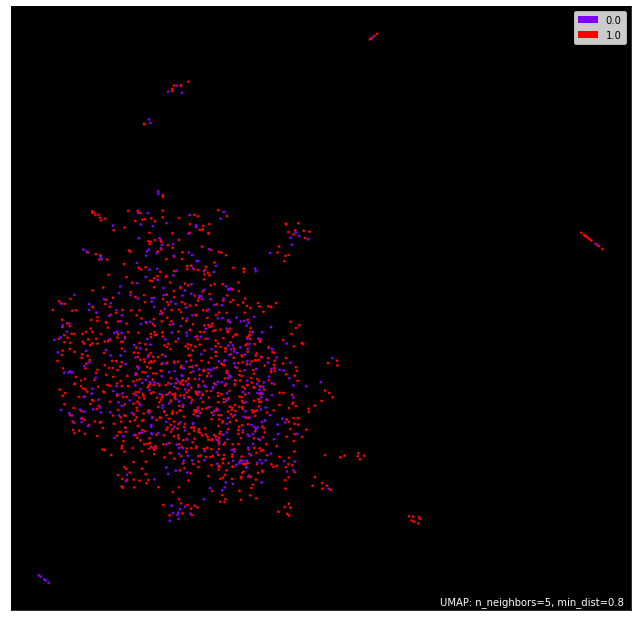

mapping MA
   Symbol        Name      Sector  inc_tweets  dec_tweets  total_tweets  \
60     MA  Mastercard  Financials        2223        2175          4398   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
60  330048372736     9432628    0.149297       0.15563     0.150423   

    mean_diff_up  mean_diff_down  
60     -0.000563        0.002604  


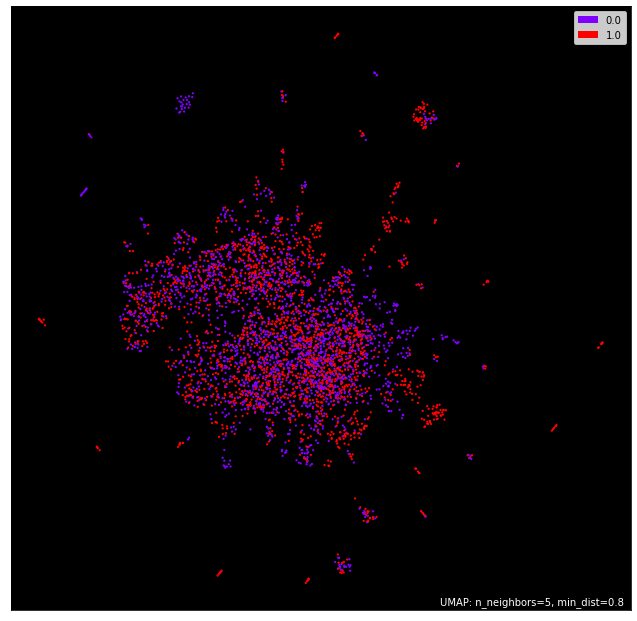

mapping MCD
   Symbol        Name                  Sector  inc_tweets  dec_tweets  \
61    MCD  McDonald's  Consumer Discretionary        3068        2061   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
61          5129  183185719296     3345574    0.120537      0.085965   

    cos_sim_btw  mean_diff_up  mean_diff_down  
61      0.09931      0.010614       -0.006673  


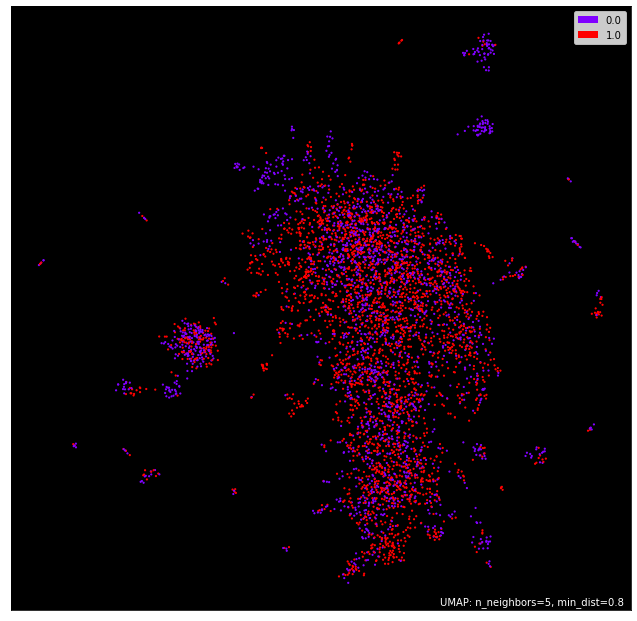

mapping MDLZ
   Symbol                    Name            Sector  inc_tweets  dec_tweets  \
62   MDLZ  Mondelēz International  Consumer Staples         171         169   

    total_tweets   market_cap  reg_volume  cos_sim_up  cos_sim_down  \
62           340  85617074176     5106170    0.207741      0.178558   

    cos_sim_btw  mean_diff_up  mean_diff_down  
62     0.189305      0.009218       -0.005373  


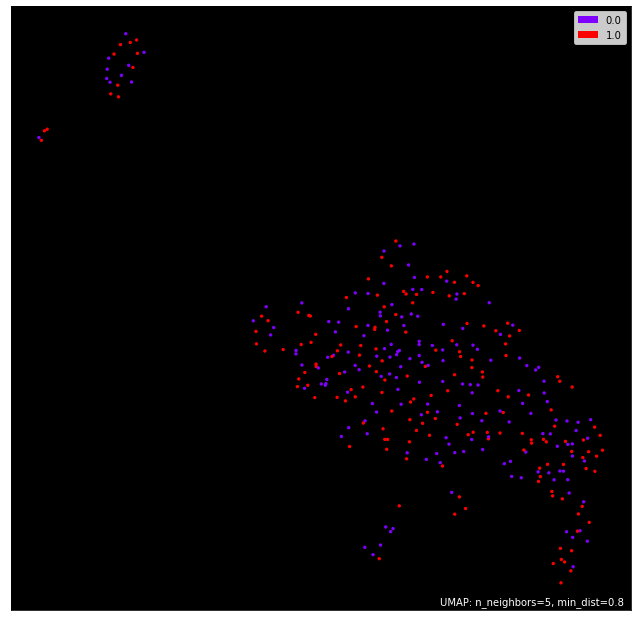

mapping MDT
   Symbol       Name       Sector  inc_tweets  dec_tweets  total_tweets  \
63    MDT  Medtronic  Health Care        1431        1722          3153   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
63  164768333824     4242868    0.177723      0.240205     0.203505   

    mean_diff_up  mean_diff_down  
63     -0.012891         0.01835  


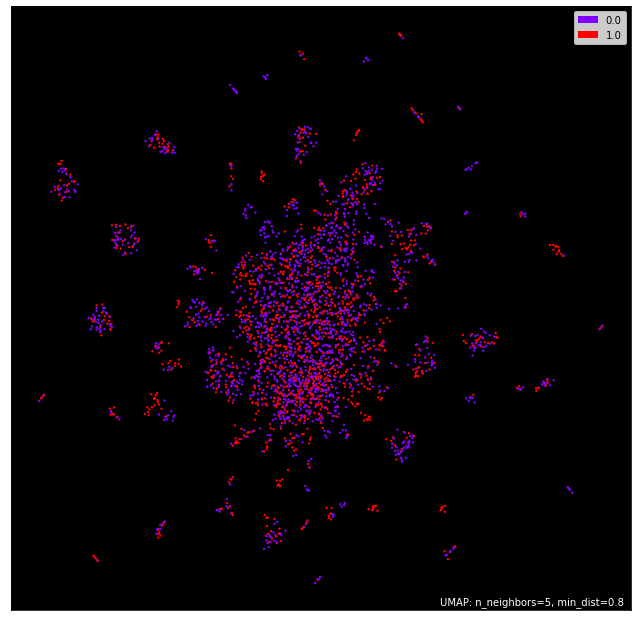

mapping MET
   Symbol     Name      Sector  inc_tweets  dec_tweets  total_tweets  \
64    MET  MetLife  Financials          92          52           144   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
64  57275469824     2612231    0.202175      0.178036      0.17442   

    mean_diff_up  mean_diff_down  
64      0.013877        0.001808  


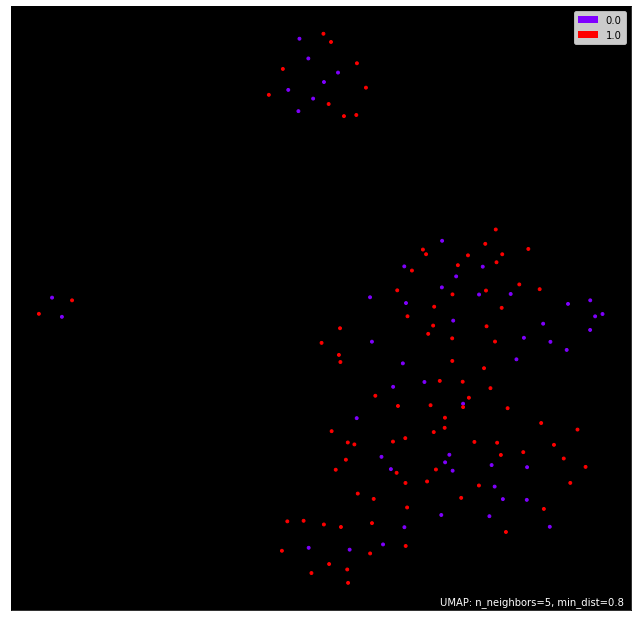

mapping MMM
   Symbol Name       Sector  inc_tweets  dec_tweets  total_tweets  \
65    MMM   3M  Industrials         961         707          1668   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
65  104266137600     1944746    0.160617      0.194732     0.159158   

    mean_diff_up  mean_diff_down  
65       0.00073        0.017787  


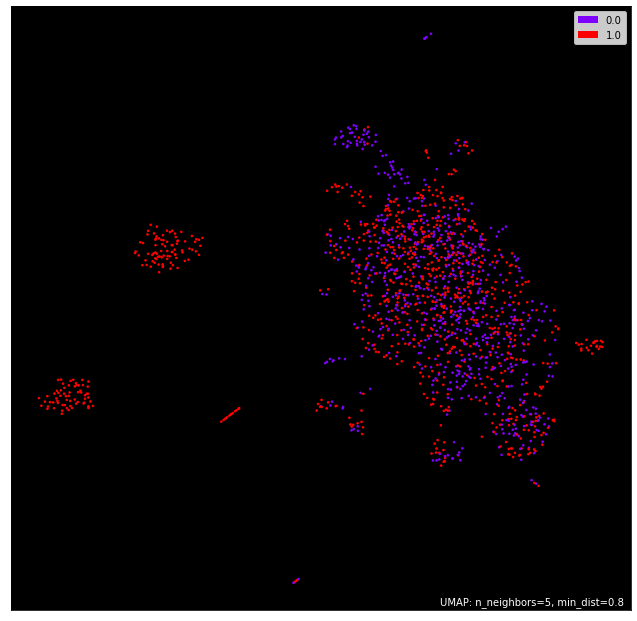

mapping MO
   Symbol    Name            Sector  inc_tweets  dec_tweets  total_tweets  \
66     MO  Altria  Consumer Staples         704        1740          2444   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
66  82887598080    22324510    0.118709      0.127201     0.120283   

    mean_diff_up  mean_diff_down  
66     -0.000787        0.003459  


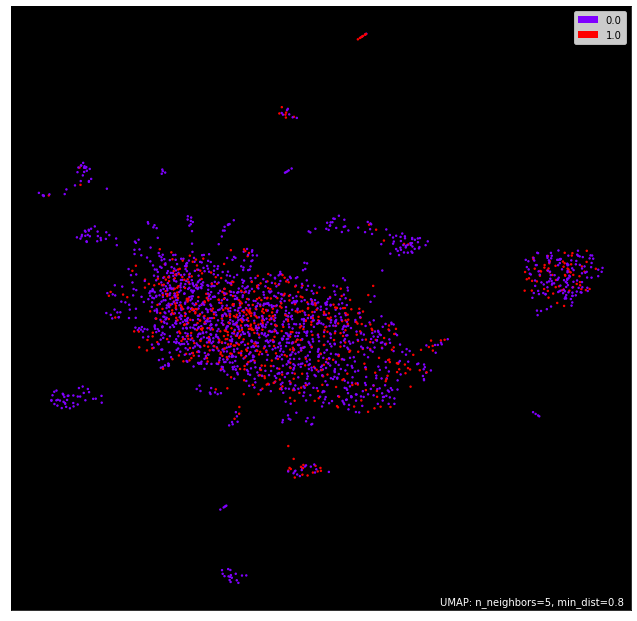

mapping MRK
   Symbol   Name       Sector  inc_tweets  dec_tweets  total_tweets  \
67    MRK  Merck  Health Care        6017        4077         10094   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
67  219149795328    28705114    0.168481      0.166577     0.166806   

    mean_diff_up  mean_diff_down  
67      0.000837       -0.000115  


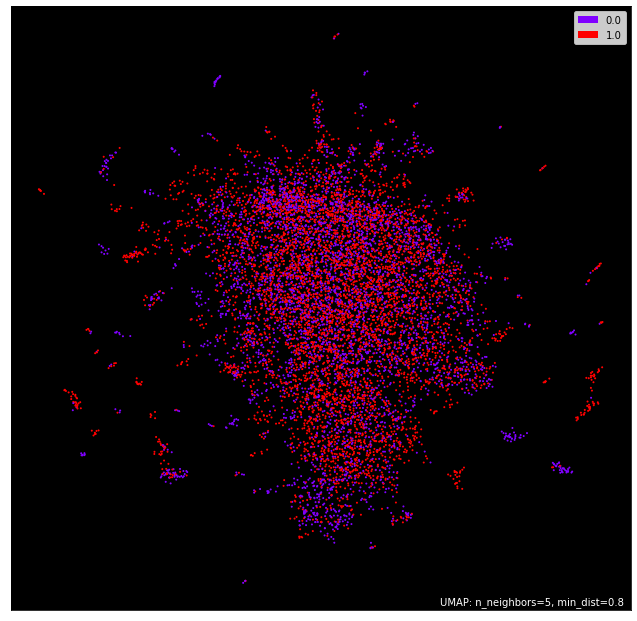

mapping MS
   Symbol            Name      Sector  inc_tweets  dec_tweets  total_tweets  \
68     MS  Morgan Stanley  Financials        2961        1815          4776   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
68  190710464512     6637731    0.119703      0.167527     0.138566   

    mean_diff_up  mean_diff_down  
68     -0.009432         0.01448  


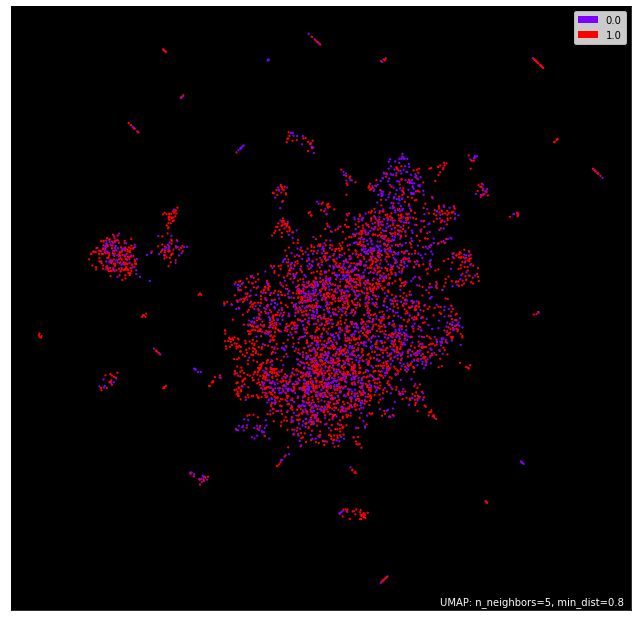

mapping MSFT
   Symbol       Name                  Sector  inc_tweets  dec_tweets  \
69   MSFT  Microsoft  Information Technology       25462       13549   

    total_tweets     market_cap  reg_volume  cos_sim_up  cos_sim_down  \
69         39011  2442864885760    26297943     0.10644      0.191937   

    cos_sim_btw  mean_diff_up  mean_diff_down  
69     0.140795     -0.017177        0.025571  


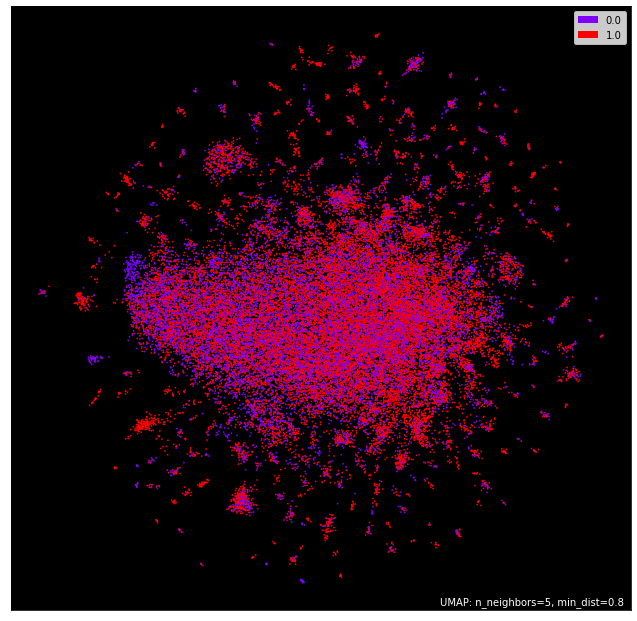

mapping NEE
   Symbol            Name     Sector  inc_tweets  dec_tweets  total_tweets  \
70    NEE  NextEra Energy  Utilities          72         112           184   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
70  169508503552     6568440    0.231268      0.138177     0.127302   

    mean_diff_up  mean_diff_down  
70      0.051983        0.005438  


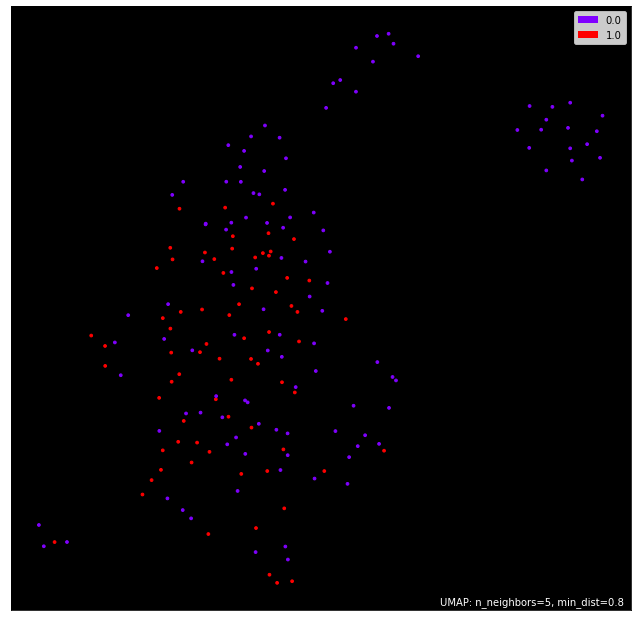

mapping NFLX
   Symbol     Name                  Sector  inc_tweets  dec_tweets  \
71   NFLX  Netflix  Communication Services       17216       15276   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
71         32492  298875781120     2859409    0.151137      0.138299   

    cos_sim_btw  mean_diff_up  mean_diff_down  
71     0.144234      0.003451       -0.002968  


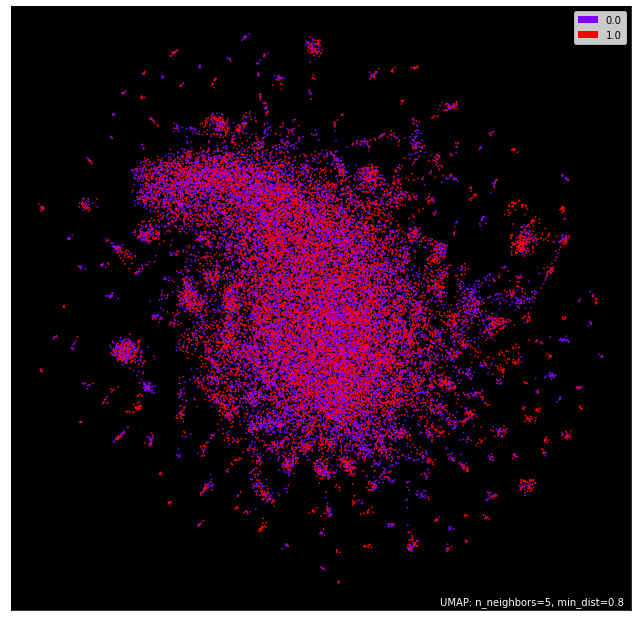

mapping NKE
   Symbol  Name                  Sector  inc_tweets  dec_tweets  total_tweets  \
72    NKE  Nike  Consumer Discretionary        2180        2272          4452   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
72  259841884160     3635763    0.218907      0.253342     0.233635   

    mean_diff_up  mean_diff_down  
72     -0.007364        0.009854  


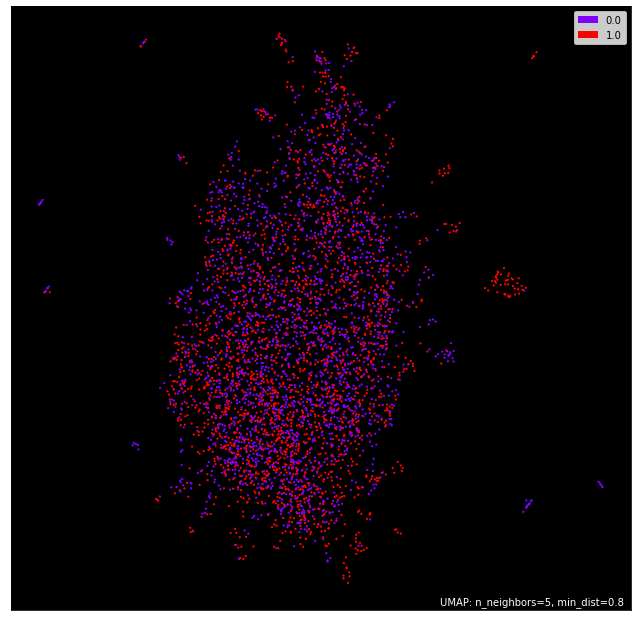

mapping NVDA
   Symbol    Name                  Sector  inc_tweets  dec_tweets  \
73   NVDA  Nvidia  Information Technology       19381       11681   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
73         31062  155382431744    23420431     0.11818       0.21065   

    cos_sim_btw  mean_diff_up  mean_diff_down  
73     0.155786     -0.018803        0.027432  


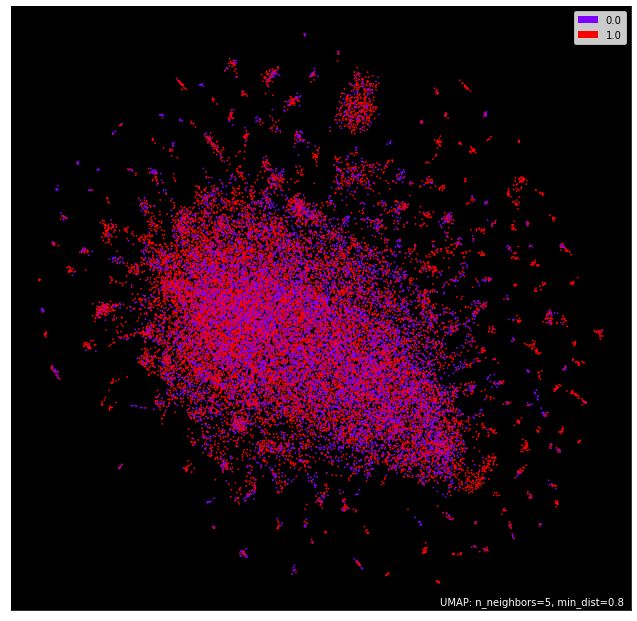

mapping ORCL
   Symbol    Name                  Sector  inc_tweets  dec_tweets  \
74   ORCL  Oracle  Information Technology        1669        1414   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
74          3083  268674170880     5176683    0.185265      0.237583   

    cos_sim_btw  mean_diff_up  mean_diff_down  
74     0.204653     -0.009694        0.016465  


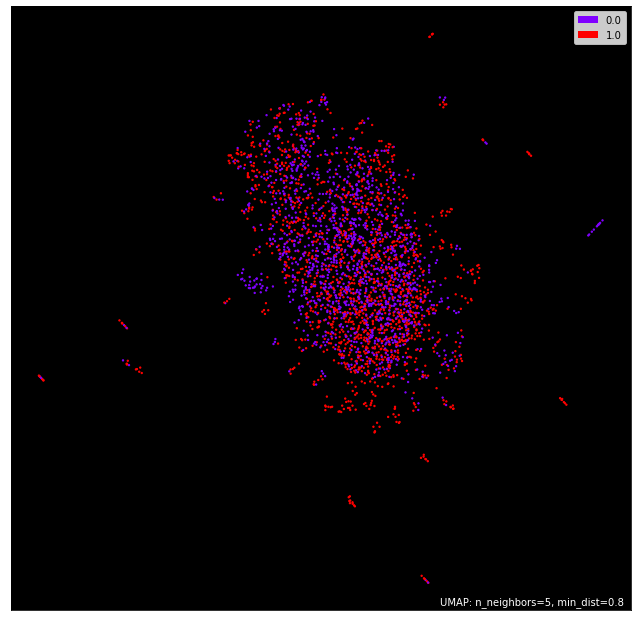

mapping PEP
   Symbol     Name            Sector  inc_tweets  dec_tweets  total_tweets  \
75    PEP  PepsiCo  Consumer Staples         706         473          1179   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
75  223299026944     3589576    0.124699      0.145622     0.123909   

    mean_diff_up  mean_diff_down  
75      0.000395        0.010856  


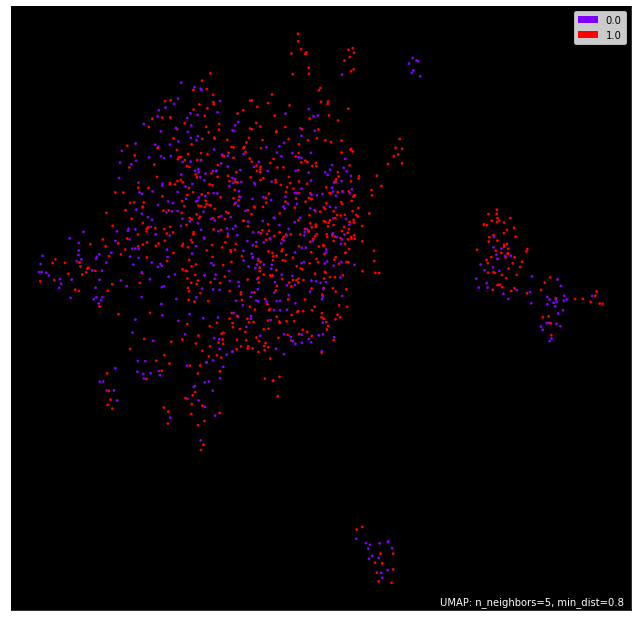

mapping PFE
   Symbol    Name       Sector  inc_tweets  dec_tweets  total_tweets  \
76    PFE  Pfizer  Health Care        6256        7522         13778   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
76  241708253184    17846956    0.140538      0.174499     0.155387   

    mean_diff_up  mean_diff_down  
76     -0.007425        0.009556  


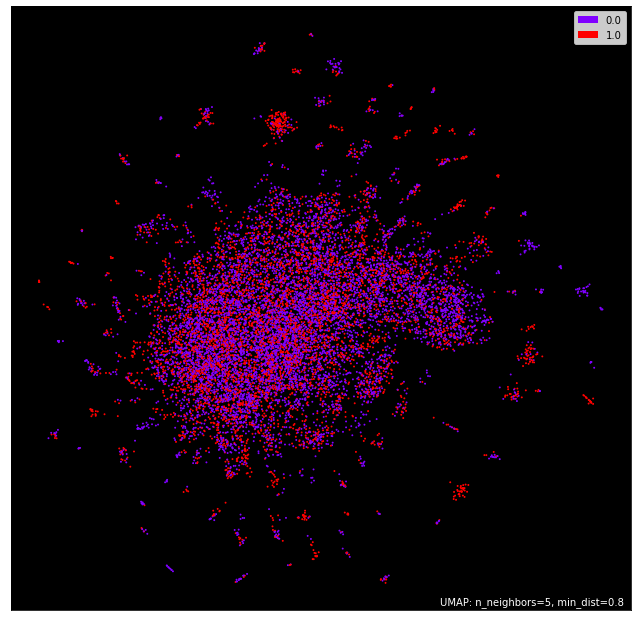

mapping PG
   Symbol              Name            Sector  inc_tweets  dec_tweets  \
77     PG  Procter & Gamble  Consumer Staples         413        1096   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
77          1509  349313433600     4529830    0.124933      0.108751   

    cos_sim_btw  mean_diff_up  mean_diff_down  
77     0.109013       0.00796       -0.000131  


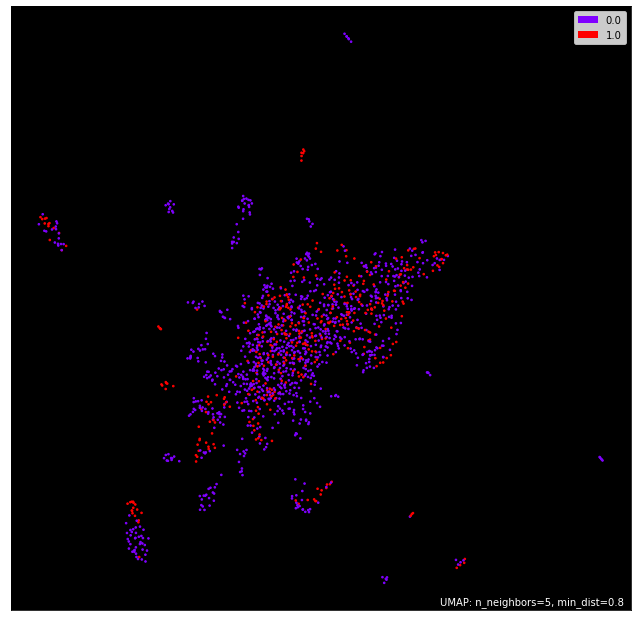

mapping PM
   Symbol                         Name            Sector  inc_tweets  \
78     PM  Philip Morris International  Consumer Staples         338   

    dec_tweets  total_tweets    market_cap  reg_volume  cos_sim_up  \
78         545           883  149573091328     4754519    0.197243   

    cos_sim_down  cos_sim_btw  mean_diff_up  mean_diff_down  
78      0.144604     0.160944      0.018149        -0.00817  


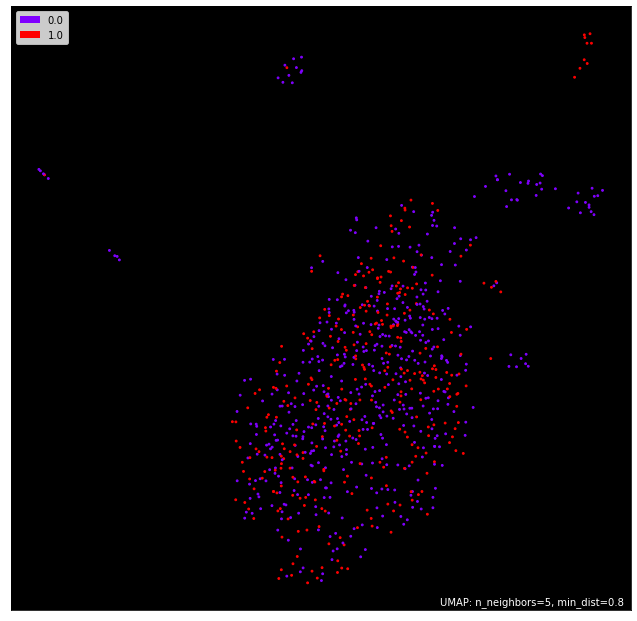

mapping PYPL
   Symbol    Name      Sector  inc_tweets  dec_tweets  total_tweets  \
79   PYPL  PayPal  Financials        5132       10620         15752   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
79  278211297280    14288265    0.145889      0.164174     0.143504   

    mean_diff_up  mean_diff_down  
79      0.001192        0.010335  


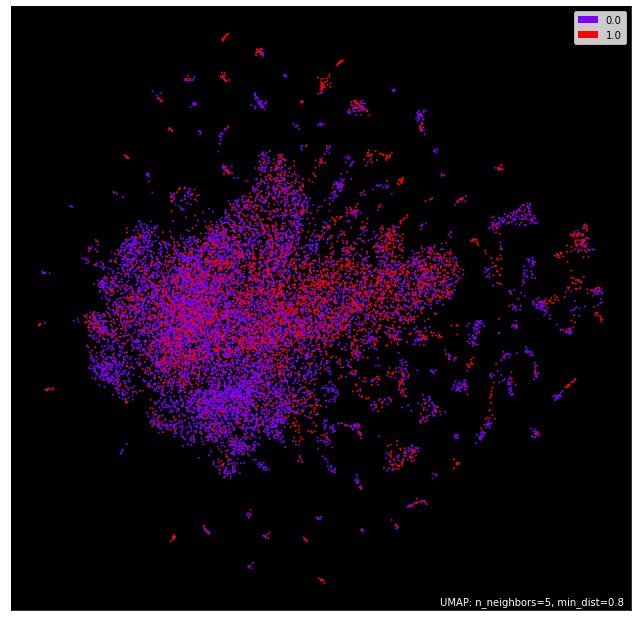

mapping QCOM
   Symbol      Name                  Sector  inc_tweets  dec_tweets  \
80   QCOM  Qualcomm  Information Technology         945        1597   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
80          2542  150802317312     4909388    0.155623      0.166974   

    cos_sim_btw  mean_diff_up  mean_diff_down  
80     0.159093     -0.001735         0.00394  


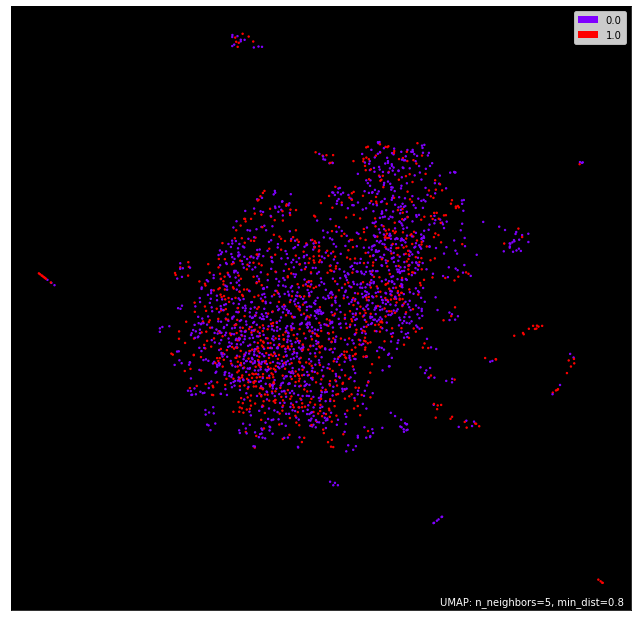

mapping RTX
   Symbol                   Name       Sector  inc_tweets  dec_tweets  \
81    RTX  Raytheon Technologies  Industrials         403         495   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
81           898  135130882048     4180169    0.164092      0.124192   

    cos_sim_btw  mean_diff_up  mean_diff_down  
81      0.13158      0.016256       -0.003694  


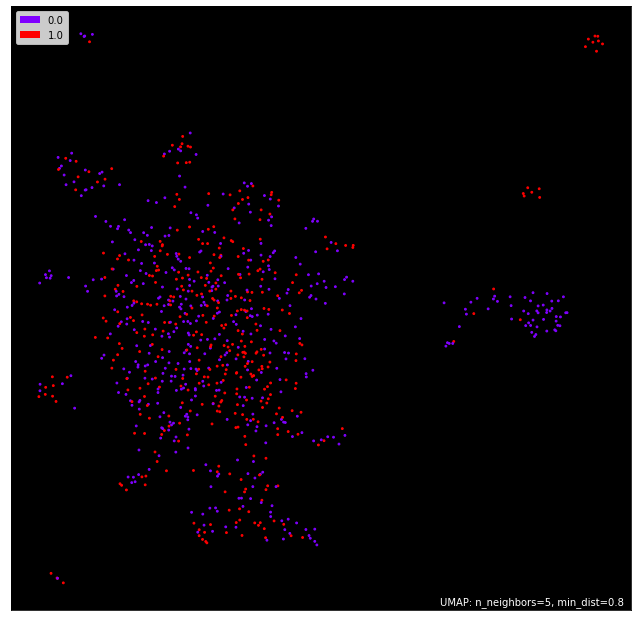

mapping SBUX
   Symbol       Name                  Sector  inc_tweets  dec_tweets  \
82   SBUX  Starbucks  Consumer Discretionary        1945        3552   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
82          5497  133383561216     7330454    0.148337       0.16775   

    cos_sim_btw  mean_diff_up  mean_diff_down  
82     0.155044     -0.003353        0.006353  


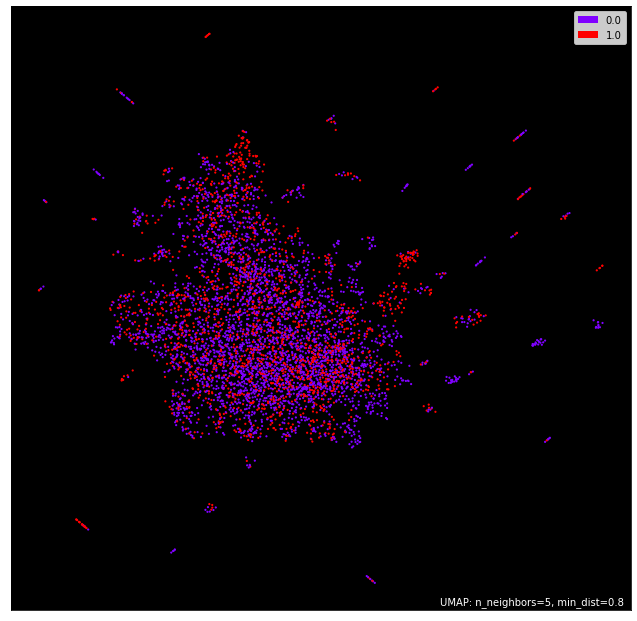

mapping SO
   Symbol              Name     Sector  inc_tweets  dec_tweets  total_tweets  \
83     SO  Southern Company  Utilities          61         248           309   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
83  66418450432     2676335    0.275924      0.247329     0.235385   

    mean_diff_up  mean_diff_down  
83      0.020269        0.005972  


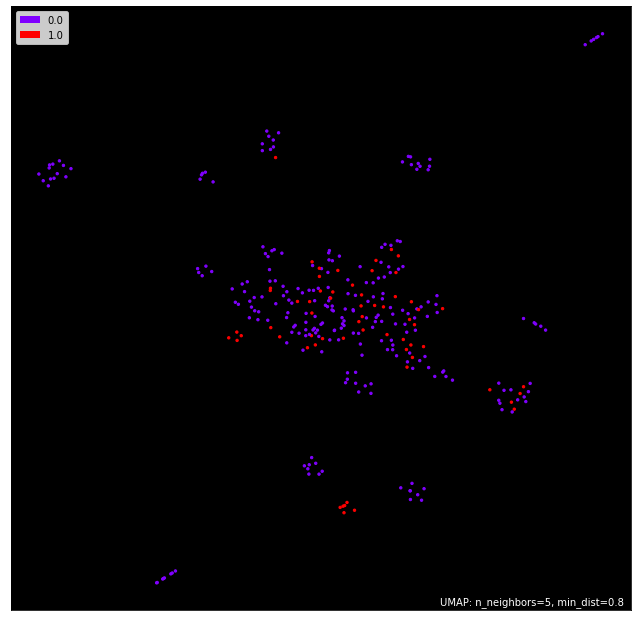

mapping SPG
   Symbol                  Name       Sector  inc_tweets  dec_tweets  \
84    SPG  Simon Property Group  Real Estate         707         507   

    total_tweets   market_cap  reg_volume  cos_sim_up  cos_sim_down  \
84          1214  48334655488     1628051    0.178209      0.228649   

    cos_sim_btw  mean_diff_up  mean_diff_down  
84     0.199749      -0.01077         0.01445  


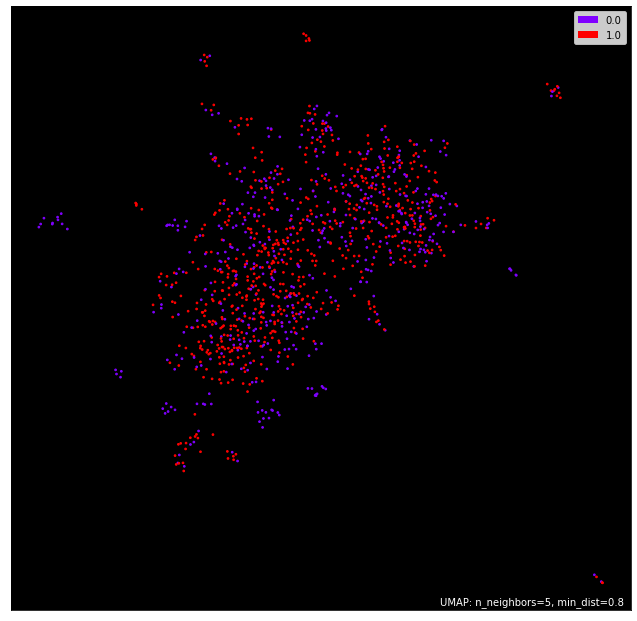

mapping T
   Symbol  Name                  Sector  inc_tweets  dec_tweets  total_tweets  \
85      T  AT&T  Communication Services        4294        7499         11793   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
85  182426992640    52872360    0.116648      0.075206       0.0894   

    mean_diff_up  mean_diff_down  
85      0.013624       -0.007097  


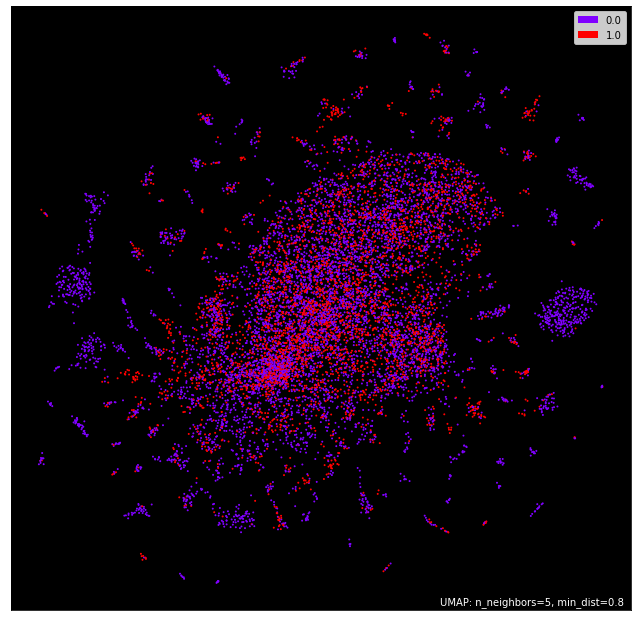

mapping TGT
   Symbol    Name            Sector  inc_tweets  dec_tweets  total_tweets  \
86    TGT  Target  Consumer Staples        2347        1635          3982   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
86  127747629056     1695470    0.132373      0.165735     0.144507   

    mean_diff_up  mean_diff_down  
86     -0.006067        0.010614  


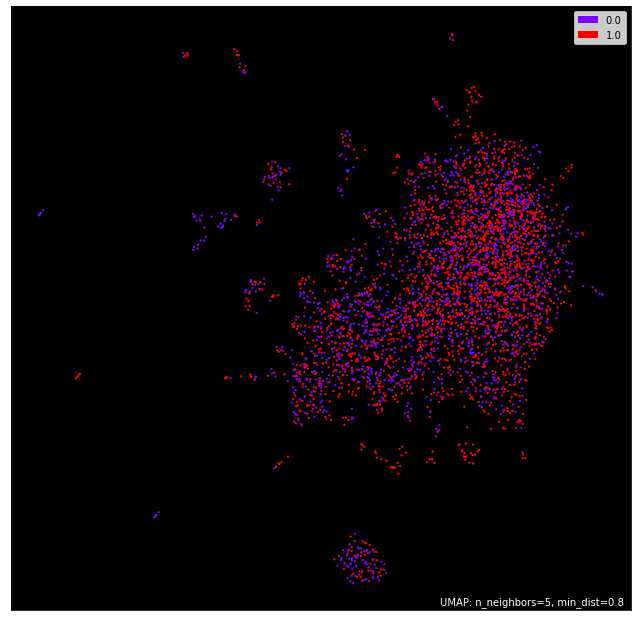

mapping TMO
   Symbol                      Name       Sector  inc_tweets  dec_tweets  \
87    TMO  Thermo Fisher Scientific  Health Care         564          51   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
87           615  243704872960     1240169    0.148028      0.260819   

    cos_sim_btw  mean_diff_up  mean_diff_down  
87     0.182307      -0.01714        0.039256  


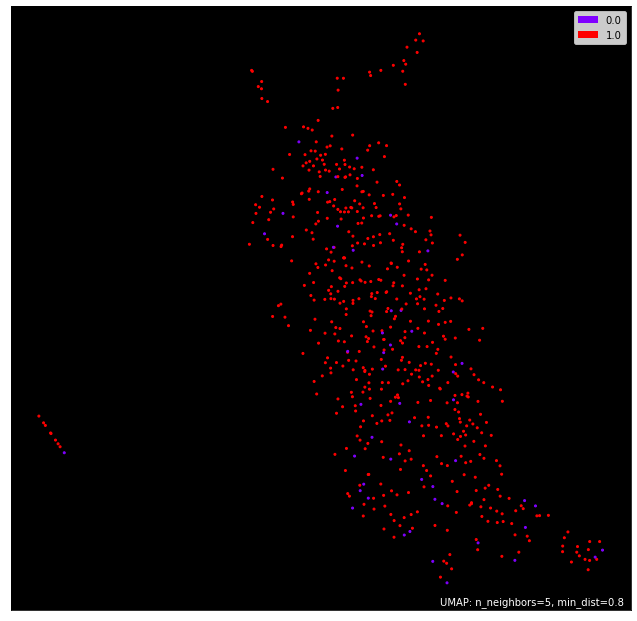

mapping TMUS
   Symbol         Name                  Sector  inc_tweets  dec_tweets  \
88   TMUS  T-Mobile US  Communication Services         220         658   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
88           878  144679829504     3256328    0.148064      0.145882   

    cos_sim_btw  mean_diff_up  mean_diff_down  
88     0.141759      0.003153        0.002062  


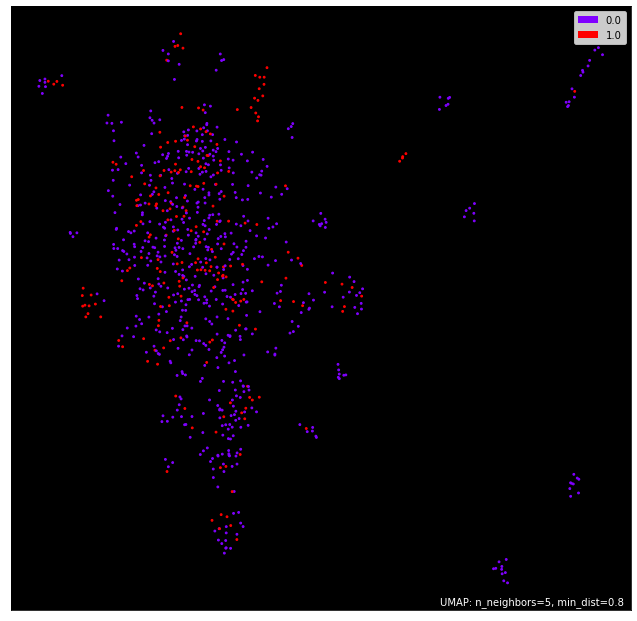

mapping TSLA
   Symbol   Name                  Sector  inc_tweets  dec_tweets  \
89   TSLA  Tesla  Consumer Discretionary      109497       54122   

    total_tweets     market_cap  reg_volume  cos_sim_up  cos_sim_down  \
89        163619  1037544980480    26039958    0.120517      0.173184   

    cos_sim_btw  mean_diff_up  mean_diff_down  
89     0.144087     -0.011785        0.014548  


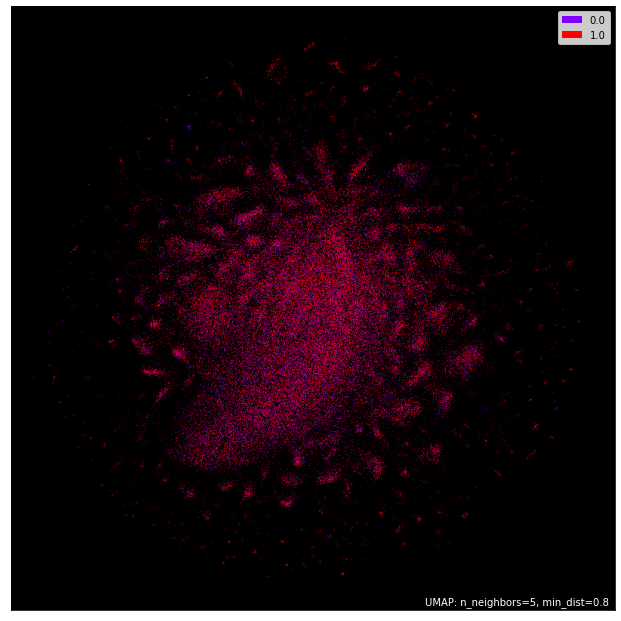

mapping TXN
   Symbol               Name                  Sector  inc_tweets  dec_tweets  \
90    TXN  Texas Instruments  Information Technology         193         425   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
90           618  172413075456     1433942    0.130853      0.128573   

    cos_sim_btw  mean_diff_up  mean_diff_down  
90     0.120194      0.005329         0.00419  


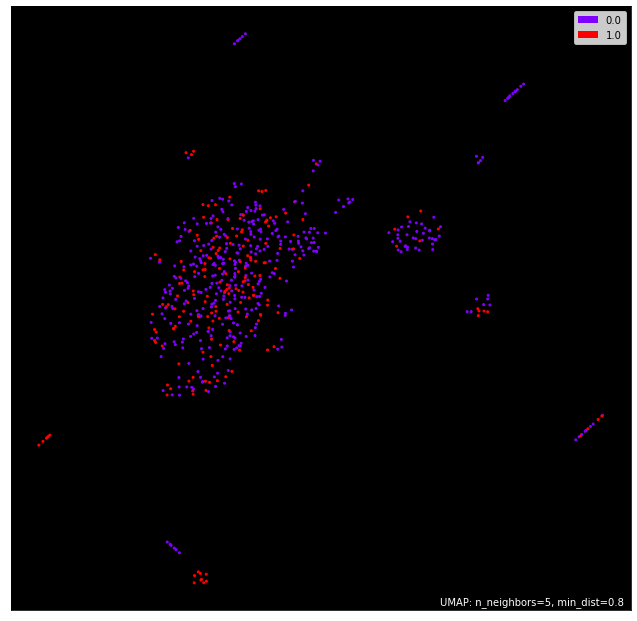

mapping UNH
   Symbol          Name       Sector  inc_tweets  dec_tweets  total_tweets  \
91    UNH  UnitedHealth  Health Care         806         203          1009   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
91  429404389376      572322     0.12089      0.158878      0.12162   

    mean_diff_up  mean_diff_down  
91     -0.000365        0.018629  


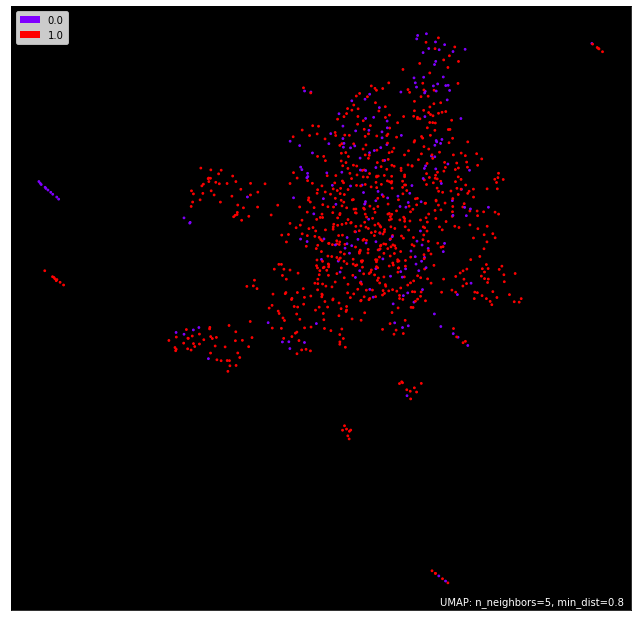

mapping UNP
   Symbol           Name       Sector  inc_tweets  dec_tweets  total_tweets  \
92    UNP  Union Pacific  Industrials          65          13            78   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
92  153171640320      546692    0.124991      0.312226     0.152641   

    mean_diff_up  mean_diff_down  
92     -0.013825        0.079792  


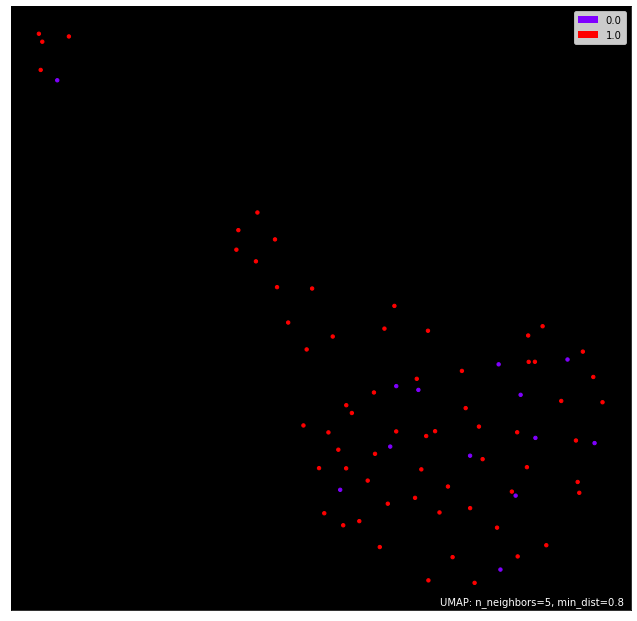

mapping UPS
   Symbol                   Name       Sector  inc_tweets  dec_tweets  \
93    UPS  United Parcel Service  Industrials        2436         298   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
93          2734  184007622656      448103    0.197116      0.222487   

    cos_sim_btw  mean_diff_up  mean_diff_down  
93     0.198135     -0.000509        0.012176  


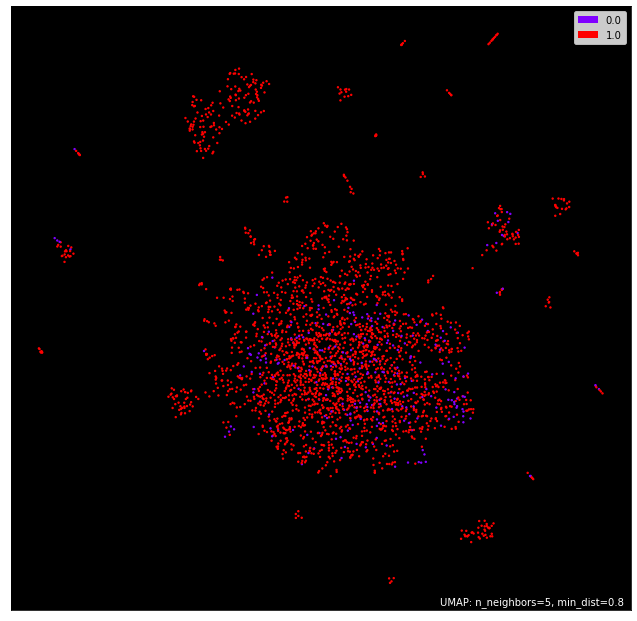

mapping USB
   Symbol          Name      Sector  inc_tweets  dec_tweets  total_tweets  \
94    USB  U.S. Bancorp  Financials          49          66           115   

     market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
94  89722560512      746100    0.154679      0.164849     0.119493   

    mean_diff_up  mean_diff_down  
94      0.017593        0.022678  


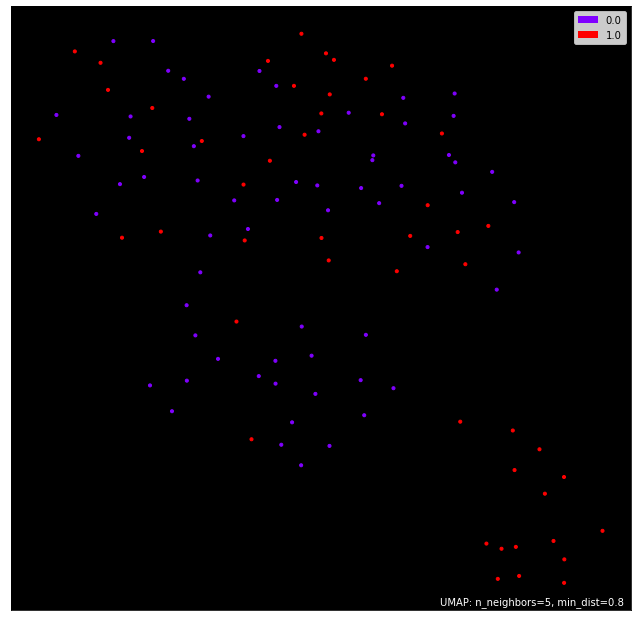

mapping V
   Symbol  Name      Sector  inc_tweets  dec_tweets  total_tweets  \
95      V  Visa  Financials        2643        3256          5899   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
95  465942118400     4059986    0.093339      0.115891     0.102461   

    mean_diff_up  mean_diff_down  
95     -0.004561        0.006715  


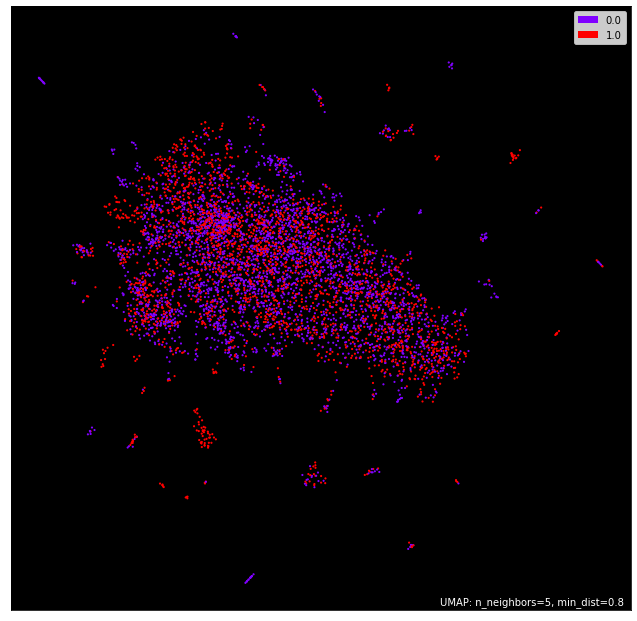

mapping VZ
   Symbol     Name                  Sector  inc_tweets  dec_tweets  \
96     VZ  Verizon  Communication Services        1146        1105   

    total_tweets    market_cap  reg_volume  cos_sim_up  cos_sim_down  \
96          2251  219945992192     4327931    0.118626      0.178347   

    cos_sim_btw  mean_diff_up  mean_diff_down  
96     0.138271     -0.009822        0.020038  


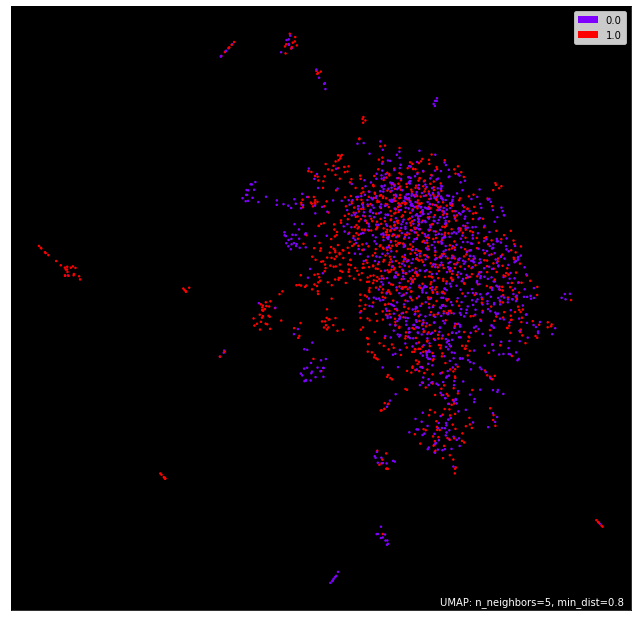

mapping WBA
   Symbol                      Name            Sector  inc_tweets  dec_tweets  \
97    WBA  Walgreens Boots Alliance  Consumer Staples         957         249   

    total_tweets   market_cap  reg_volume  cos_sim_up  cos_sim_down  \
97          1206  41194475520     1681195    0.147371      0.153324   

    cos_sim_btw  mean_diff_up  mean_diff_down  
97     0.121459      0.012956        0.015933  


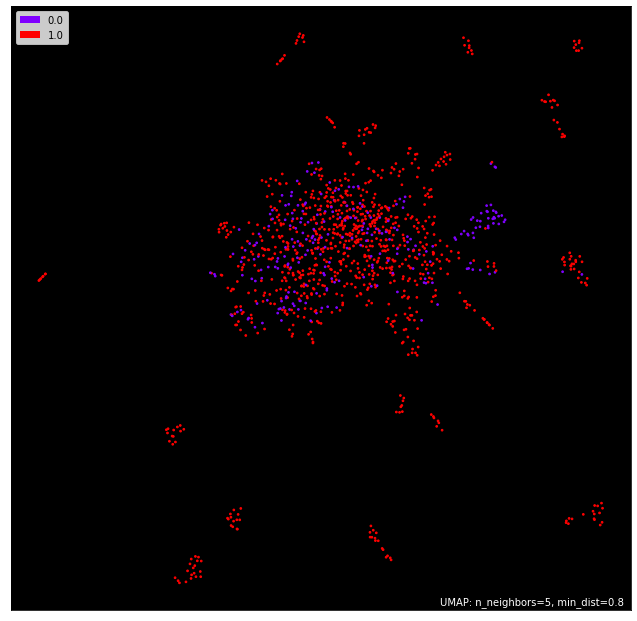

mapping WFC
   Symbol         Name      Sector  inc_tweets  dec_tweets  total_tweets  \
98    WFC  Wells Fargo  Financials        1727        2364          4091   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
98  205961281536     5012361    0.138745      0.187515     0.152834   

    mean_diff_up  mean_diff_down  
98     -0.007044        0.017341  


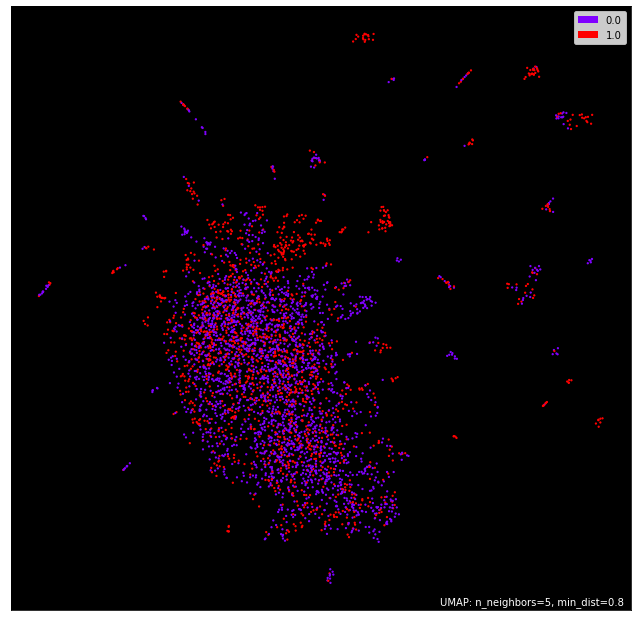

mapping WMT
   Symbol     Name            Sector  inc_tweets  dec_tweets  total_tweets  \
99    WMT  Walmart  Consumer Staples        4343        4013          8356   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
99  417731215360     1363455    0.127975      0.196313     0.151226   

    mean_diff_up  mean_diff_down  
99     -0.011625        0.022544  


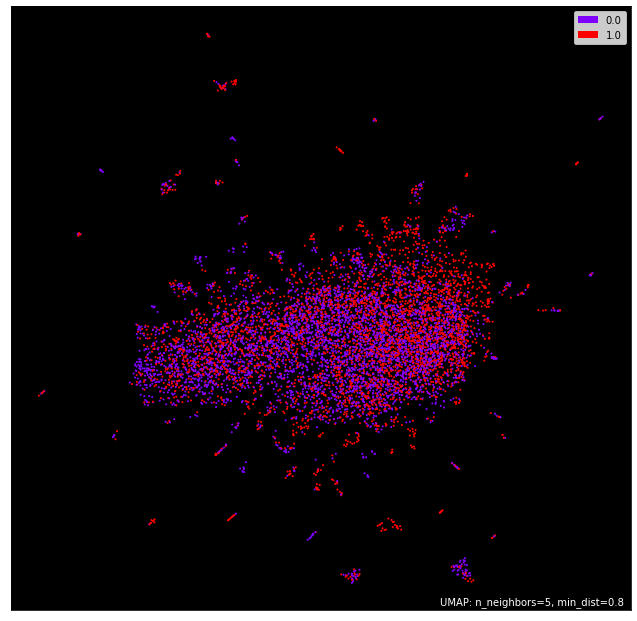

mapping XOM
    Symbol        Name  Sector  inc_tweets  dec_tweets  total_tweets  \
100    XOM  ExxonMobil  Energy        5752        2203          7955   

       market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
100  278441230336     6349941    0.180196       0.18574     0.181931   

     mean_diff_up  mean_diff_down  
100     -0.000868        0.001904  


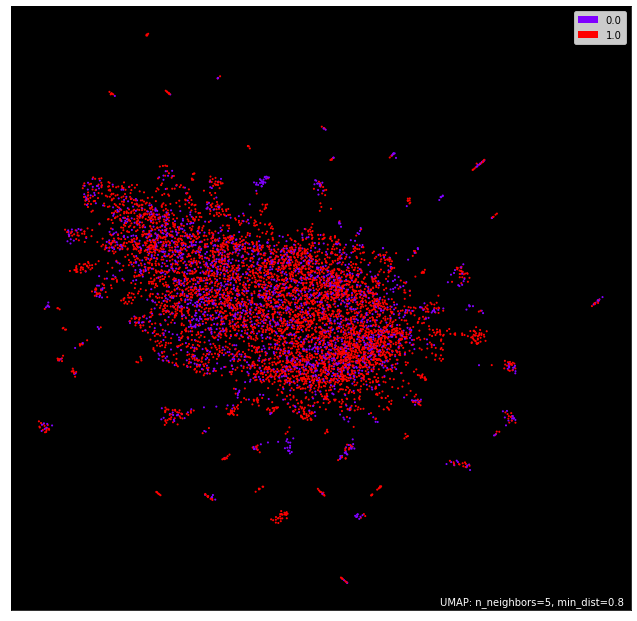

In [133]:
outpath = 'C:\\Users\\AlexGolden\\Dropbox (BOSTON UNIVERSITY)\\twitter_stocks_project\\twitter_stock_reactions\\umap_output\\'

for ticker in tickers:
    print('mapping',ticker)
    tck_df = df.loc[df['Ticker']==ticker]
    tck_docs = list(tag_titles(tck_df['text']))
    tck_labels = tck_df['slope_labels']
    tck_vectors = np.zeros((len(tck_docs),300))
    for i,doc in enumerate(tck_docs):
        tck_vectors[i,:] = doc_vec_model.infer_vector(doc.words)
    
    print(sp100_df_copy.loc[sp100_df_copy['Symbol'] == ticker])
        
    mapper = umap.UMAP(min_dist=0.8, n_neighbors=5, output_metric='euclidean').fit(tck_vectors)

    umap.plot.points(mapper, labels=tck_labels.to_numpy(), theme='fire')
    # plt.savefig(outpath+ticker+'_umap.png')
    plt.show()

In [86]:
cossim_btw = cosine_similarity(tck_vectors[tck_labels == 0],tck_vectors[tck_labels == 1])
cossim_down = cosine_similarity(tck_vectors[tck_labels == 0],tck_vectors[tck_labels == 0])
cossim_up = cosine_similarity(tck_vectors[tck_labels == 1],tck_vectors[tck_labels == 1])
print('mean cosine similarity for 0 labels:',np.mean(cossim_down))
print('mean cosine similarity for 1 labels:',np.mean(cossim_up))
print('mean cosine similarity between sets:',np.mean(cossim_btw))
print('mean difference for 0 labels',(np.mean(cossim_down)-np.mean(cossim_btw))/2)
print('mean difference for 1 labels',(np.mean(cossim_up)-np.mean(cossim_btw))/2)
print('cosine similarity std for 0 labels:',np.mean(cossim_down))
print('cosine similarity std for 1 labels:',np.mean(cossim_up))
print('cosine similarity std between sets:',np.mean(cossim_btw))

mean cosine similarity for 0 labels: 0.3183368756310153
mean cosine similarity for 1 labels: 0.3035693996451395
mean cosine similarity between sets: 0.3105748558004199
mean difference for 0 labels 0.0038810099152977173
mean difference for 1 labels -0.0035027280776401826
cosine similarity std for 0 labels: 0.3183368756310153
cosine similarity std for 1 labels: 0.3035693996451395
cosine similarity std between sets: 0.3105748558004199


In [96]:
int(data.get_quote_yahoo(ticker)['volume'])

KeyError: 'volume'

In [97]:
tick = yf.Ticker(ticker)

mapping BLK
   Symbol       Name      Sector  inc_tweets  dec_tweets  total_tweets  \
16    BLK  BlackRock  Financials        1405        1602          3007   

      market_cap  reg_volume  cos_sim_up  cos_sim_down  cos_sim_btw  \
16  142685011968      352210    0.121173      0.180943     0.137353   

    mean_diff_up  mean_diff_down  
16      -0.00809        0.021795  


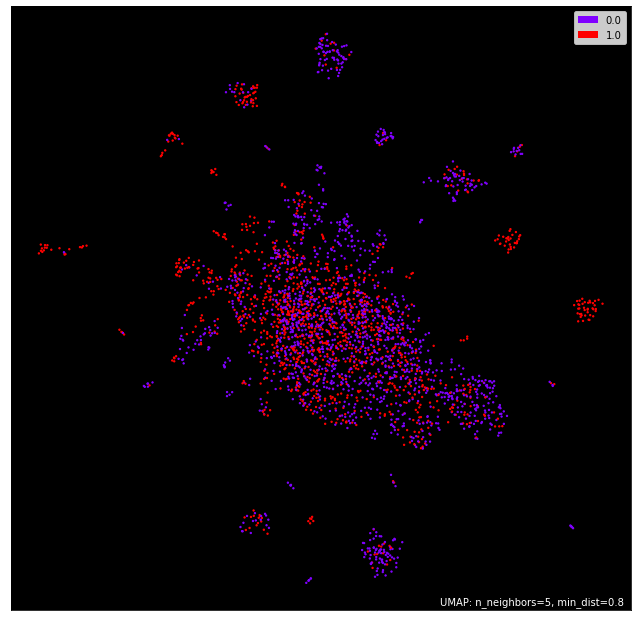

In [134]:
ticker = 'BLK'
print('mapping',ticker)
tck_df = df.loc[df['Ticker']==ticker]
tck_docs = list(tag_titles(tck_df['text']))
tck_labels = tck_df['slope_labels']
tck_vectors = np.zeros((len(tck_docs),300))
for i,doc in enumerate(tck_docs):
    tck_vectors[i,:] = doc_vec_model.infer_vector(doc.words)

print(sp100_df_copy.loc[sp100_df_copy['Symbol'] == ticker])

mapper = umap.UMAP(min_dist=0.8, n_neighbors=5, output_metric='euclidean').fit(tck_vectors)

umap.plot.points(mapper, labels=tck_labels.to_numpy(), theme='fire')
# plt.savefig(outpath+ticker+'_umap.png')
plt.show()

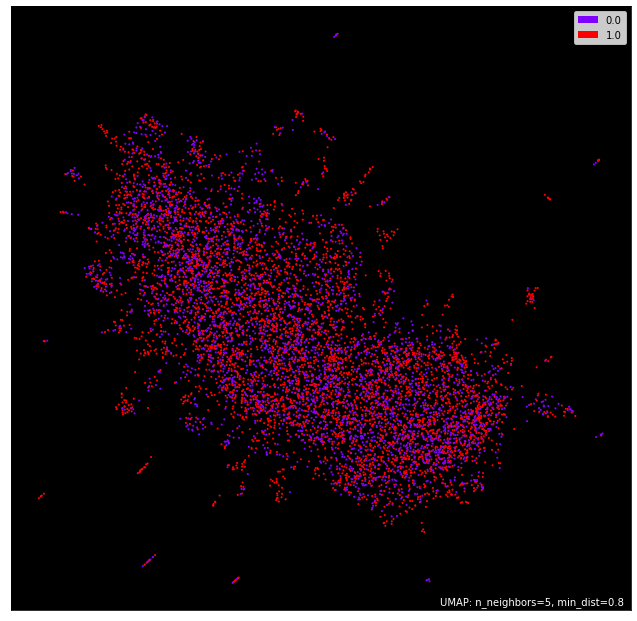

In [77]:
mapper = umap.UMAP(min_dist=0.8, n_neighbors=5, output_metric='euclidean').fit(tck_vectors)

umap.plot.points(mapper, labels=tck_labels.to_numpy(), theme='fire')
plt.savefig('test.png')

,Symbol,Name,Sector
0,AAPL,Apple,Information Technology
1,ABBV,AbbVie,Health Care
2,ABT,Abbott Laboratories,Health Care
3,ACN,Accenture,Information Technology
4,ADBE,Adobe,Information Technology
...,...,...,...
96,VZ,Verizon,Communication Services
97,WBA,Walgreens Boots Alliance,Consumer Staples
98,WFC,Wells Fargo,Financials
99,WMT,Walmart,Consumer Staples


<AxesSubplot:>

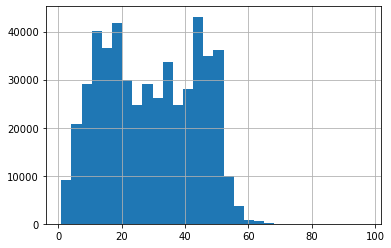

In [6]:
# get length of all the messages in the train set
seq_len = [len(i.split()) for i in train_text]

pd.Series(seq_len).hist(bins = 30)

In [7]:
pad_len = 65

# tokenize and encode sequences in the training set
tokens_train = tokenizer.batch_encode_plus(
    train_text.tolist(),
    max_length = pad_len,
    pad_to_max_length=True,
    truncation=True
)

# tokenize and encode sequences in the validation set
tokens_val = tokenizer.batch_encode_plus(
    val_text.tolist(),
    max_length = pad_len,
    pad_to_max_length=True,
    truncation=True
)

# tokenize and encode sequences in the test set
tokens_test = tokenizer.batch_encode_plus(
    test_text.tolist(),
    max_length = pad_len,
    pad_to_max_length=True,
    truncation=True
)

KeyboardInterrupt: 

In [ ]:
train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels.tolist())

val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels.tolist())

test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels.tolist())

In [ ]:
#define a batch size
batch_size = 32

# wrap tensors
train_data = TensorDataset(train_seq, train_mask, train_y)

# sampler for sampling the data during training
train_sampler = RandomSampler(train_data)

# dataLoader for train set
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

# wrap tensors
val_data = TensorDataset(val_seq, val_mask, val_y)

# sampler for sampling the data during training
val_sampler = SequentialSampler(val_data)

# dataLoader for validation set
val_dataloader = DataLoader(val_data, sampler = val_sampler, batch_size=batch_size)

In [ ]:
train_seq_df = pd.DataFrame(train_seq.numpy())

In [ ]:
mapper = umap.UMAP(min_dist=0.8, n_neighbors=5, output_metric='euclidean').fit(train_seq_df)

In [ ]:
mapper = umap.UMAP(min_dist=0.8, n_neighbors=5, output_metric='euclidean').fit(train_seq_df)

In [ ]:
umapped_pts = umap.plot.points(mapper, labels=train_y.numpy(), theme='fire')

In [ ]:
def umap_ticker(ticker_str,tweet_df):
    print('mapping ticker:',ticker_str)
    ticker_df = tweet_df.loc[tweet_df['Ticker'] == ticker_str]
    # split train dataset into train, validation and test sets
    train_text, temp_text, train_labels, temp_labels = train_test_split(df['text'], df['slope_labels'].astype(np.int64), 
                                                                        random_state=2018, 
                                                                        test_size=0.3, 
                                                                        stratify=df['slope_labels'])


    val_text, test_text, val_labels, test_labels = train_test_split(temp_text, temp_labels, 
                                                                    random_state=2018, 
                                                                    test_size=0.5, 
                                                                    stratify=temp_labels)
    tokens_train = tokenizer.batch_encode_plus(
    train_text.tolist(),
    max_length = pad_len,
    pad_to_max_length=True,
    truncation=True
    )

    # tokenize and encode sequences in the validation set
    tokens_val = tokenizer.batch_encode_plus(
    val_text.tolist(),
    max_length = pad_len,
    pad_to_max_length=True,
    truncation=True
    )

    # tokenize and encode sequences in the test set
    tokens_test = tokenizer.batch_encode_plus(
    test_text.tolist(),
    max_length = pad_len,
    pad_to_max_length=True,
    truncation=True
    )
    
    train_seq = torch.tensor(tokens_train['input_ids'])
    train_mask = torch.tensor(tokens_train['attention_mask'])
    train_y = torch.tensor(train_labels.tolist())

    val_seq = torch.tensor(tokens_val['input_ids'])
    val_mask = torch.tensor(tokens_val['attention_mask'])
    val_y = torch.tensor(val_labels.tolist())

    test_seq = torch.tensor(tokens_test['input_ids'])
    test_mask = torch.tensor(tokens_test['attention_mask'])
    test_y = torch.tensor(test_labels.tolist())
        
    train_seq_df = pd.DataFrame(train_seq.numpy())
    
    mapper = umap.UMAP(min_dist=0.8, n_neighbors=5, output_metric='euclidean').fit(train_seq_df)
    
    umap.plot.points(mapper, labels=train_y.numpy(), theme='fire')

In [50]:
ticker_str = 'MMM'
print('mapping ticker:',ticker_str)
ticker_df = df.loc[df['Ticker'] == ticker_str][['text','slope_labels']]
ticker_df = ticker_df[['text','slope_labels']].drop_duplicates()
# split train dataset into train, validation and test sets
train_text, temp_text, train_labels, temp_labels = train_test_split(df['text'], df['slope_labels'].astype(np.int64), 
                                                                    random_state=2018, 
                                                                    test_size=0.3, 
                                                                    stratify=df['slope_labels'])


val_text, test_text, val_labels, test_labels = train_test_split(temp_text, temp_labels, 
                                                                random_state=2018, 
                                                                test_size=0.5, 
                                                                stratify=temp_labels)
tokens_train = tokenizer.batch_encode_plus(
train_text.tolist(),
max_length = pad_len,
pad_to_max_length=True,
truncation=True
)

# tokenize and encode sequences in the validation set
tokens_val = tokenizer.batch_encode_plus(
val_text.tolist(),
max_length = pad_len,
pad_to_max_length=True,
truncation=True
)

# tokenize and encode sequences in the test set
tokens_test = tokenizer.batch_encode_plus(
test_text.tolist(),
max_length = pad_len,
pad_to_max_length=True,
truncation=True
)

train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels.tolist())

val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels.tolist())

test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels.tolist())

train_seq_np = train_seq.numpy()


mapping ticker: MMM


C:\Users\AlexGolden\anaconda3\lib\site-packages\transformers\tokenization_utils_base.py:2184: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  warnings.warn(


In [52]:
train_seq_np = train_seq_np.astype(np.float32) + np.random.normal(0,0.0001,train_seq_np.shape)

In [53]:

mapper = umap.UMAP(min_dist=0.8, n_neighbors=5, output_metric='euclidean').fit(train_seq_df)

umap.plot.points(mapper, labels=train_y.numpy(), theme='fire')

C:\Users\AlexGolden\anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
C:\Users\AlexGolden\anaconda3\lib\site-packages\umap\spectral.py:255: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
C:\Users\AlexGolden\anaconda3\lib\site-packages\umap\spectral.py:255: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
C:\Users\AlexGolden\anaconda3\lib\site-packages\umap\spectral.py:255: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed.

KeyboardInterrupt: 

In [21]:
ticker_df[['text','slope_labels']]

,text,slope_labels
0,3M $MMM PT Lowered to $182.00 https://t.co/vKu...,1.0
1,3M $MMM PT Lowered to $182.00 https://t.co/CUE...,1.0
2,PFAS “forever chemicals” makes it to Last Week...,1.0
3,Gapping Down - Downgrades\n$VERX -3.4% Underpe...,1.0
4,Here's what we've got our eye on today:\n$TSLA...,1.0
...,...,...
624,"3M joins Water Resilience Coalition, CEO Water...",0.0
625,"$MMM 3M joins Water Resilience Coalition, CEO ...",0.0
626,"$MMM 📰 3M joins Water Resilience Coalition, CE...",0.0
627,"$MMM 3M joins Water Resilience Coalition, CEO ...",0.0


In [44]:
print(ticker_df[['text','slope_labels']].duplicated().any())
print(len(ticker_df)*ticker_df[['text','slope_labels']].duplicated().mean())
print(len(ticker_df))
dropped = ticker_df[['text','slope_labels']].drop_duplicates()
print(len(dropped))

True
9.0
629
620


In [33]:
ticker_df[['text','slope_labels']].duplicated().argmax()

29

In [37]:
len(ticker_df[['text','slope_labels']])

629

In [36]:
len(dropped)

629

In [34]:
ticker_df[['text','slope_labels']].iloc[25:35]

,text,slope_labels
25,Stock futures fall heading into first full wee...,1.0
26,JPMorgan's Tusa downgrades 3M on lack of progr...,1.0
27,Twitter Average Sentiment\n$AMD $GOOG $FB $MMM...,1.0
28,#Stocks making the biggest moves in the premar...,1.0
29,JPMorgan's Tusa downgrades 3M on lack of progr...,1.0
30,$IT $EAT $MS $MAIN $OUT $CUBS\n$MMM! $I $AM $A...,1.0
31,#GoodMorning #StockMarket Prep for 10/4/21!\n\...,1.0
32,$MMM [3M]: JP Morgan Downgrades Overweight --&...,1.0
33,Notable activity on social media recently for\...,1.0
34,An investor related #classaction against #3M w...,1.0


In [38]:
dropped[['text','slope_labels']].iloc[25:35]

,text,slope_labels
25,Stock futures fall heading into first full wee...,1.0
26,JPMorgan's Tusa downgrades 3M on lack of progr...,1.0
27,Twitter Average Sentiment\n$AMD $GOOG $FB $MMM...,1.0
28,#Stocks making the biggest moves in the premar...,1.0
29,JPMorgan's Tusa downgrades 3M on lack of progr...,1.0
30,$IT $EAT $MS $MAIN $OUT $CUBS\n$MMM! $I $AM $A...,1.0
31,#GoodMorning #StockMarket Prep for 10/4/21!\n\...,1.0
32,$MMM [3M]: JP Morgan Downgrades Overweight --&...,1.0
33,Notable activity on social media recently for\...,1.0
34,An investor related #classaction against #3M w...,1.0


In [42]:
print(dropped[['text']].iloc[26].item())

JPMorgan's Tusa downgrades 3M on lack of progress, prefers DuPont
$MMM $DD


In [43]:
print(dropped[['text']].iloc[29].item())

JPMorgan's Tusa downgrades 3M on lack of progress, prefers DuPont
$MMM $DD


In [ ]:
spam_train_seq = torch.tensor(spam_tokens_train['input_ids'])
spam_train_mask = torch.tensor(spam_tokens_train['attention_mask'])
spam_train_y = torch.tensor(spam_train_labels.tolist())

# for validation set
spam_val_seq = torch.tensor(spam_tokens_val['input_ids'])
spam_val_mask = torch.tensor(spam_tokens_val['attention_mask'])
spam_val_y = torch.tensor(spam_val_labels.tolist())

# for test set
spam_test_seq = torch.tensor(spam_tokens_test['input_ids'])
spam_test_mask = torch.tensor(spam_tokens_test['attention_mask'])
spam_test_y = torch.tensor(spam_test_labels.tolist())

In [ ]:
mapper = umap.UMAP(min_dist=0.0, n_neighbors=40, output_metric='euclidean').fit(spam_train_seq_df)
umap.plot.points(mapper, labels=spam_train_y, theme='fire')